In [1]:
%matplotlib inline
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pickle

In [2]:
object_points_list = []  # 3d points in real world space. (Same for all)
image_points_list = []  # 2d points in image plane.

In [3]:
nx, ny = 9, 6  # inside corners in rows, columns
object_points = np.zeros((nx * ny, 3), np.float32)
object_points[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

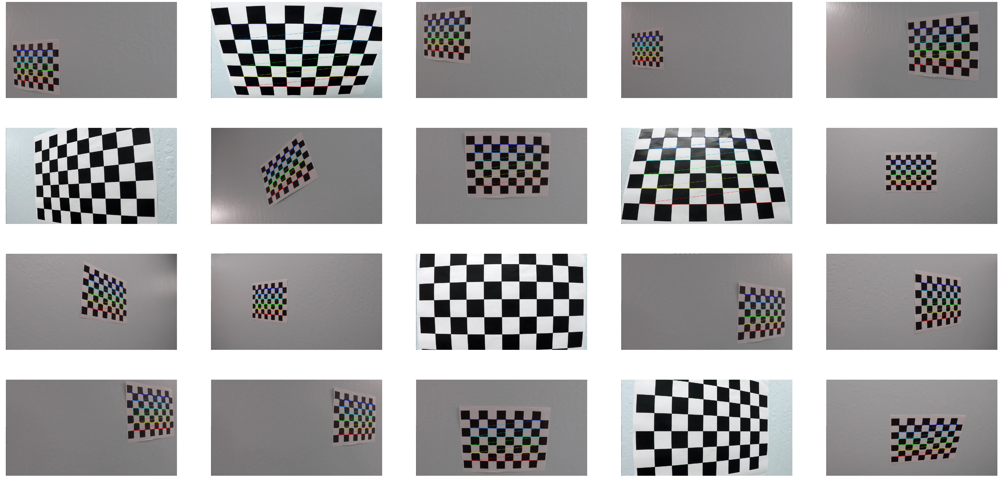

In [4]:
images = glob.glob("camera_cal/calibration*.jpg")
assert len(images) == 20
plt.figure(figsize=(100, 50))
for i in range(len(images)):
    img = cv2.imread(images[i])
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    retval, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    if retval:
        cv2.drawChessboardCorners(img, (nx, ny), corners, retval)
        image_points_list.append(corners)
        object_points_list.append(object_points)
    plt.subplot(4, 5, i + 1)
    plt.axis('off')
    plt.imshow(img)

In [5]:
def plot_2(images, titles):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))    
    ax1.imshow(cv2.cvtColor(images[0], cv2.COLOR_BGR2RGB))
    ax1.set_title(titles[0])    
    ax2.imshow(cv2.cvtColor(images[1], cv2.COLOR_BGR2RGB))
    ax2.set_title(titles[1])

In [6]:
img = cv2.imread(images[1])
img_size = (img.shape[1], img.shape[0])
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_points_list, image_points_list, img_size, None, None)
img1 = cv2.undistort(img, mtx, dist, None, mtx)

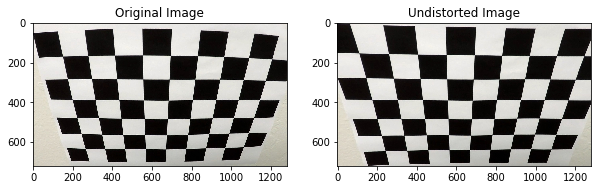

In [7]:
plot_2((img, img1), ('Original Image', 'Undistorted Image'))

In [8]:
print('cameraMatrix= ', mtx, '\n')
print('distCoeffs= ', dist)

cameraMatrix=  [[  1.15396093e+03   0.00000000e+00   6.69705357e+02]
 [  0.00000000e+00   1.14802496e+03   3.85656234e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]] 

distCoeffs=  [[ -2.41017956e-01  -5.30721172e-02  -1.15810355e-03  -1.28318857e-04
    2.67125292e-02]]


In [9]:
dumpling = {'mtx': mtx, 'dist': dist}
pickle.dump(dumpling, open("camera_calibration_param.p", "wb"))

In [10]:
from collections import deque
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
import numpy as np
import pickle
%matplotlib inline

In [11]:
with open("camera_calibration_param.p", mode='rb') as f:
    calibration_param = pickle.load(f)
cameraMatrix, distCoeffs = calibration_param["mtx"], calibration_param["dist"]

In [12]:
def undistort(image, show=True, read = True):
    if read:
        img = cv2.imread(image)
    img_size = (img.shape[1], img.shape[0])
    undist = cv2.undistort(img, cameraMatrix, distCoeffs, None, cameraMatrix)
    if show:
        plot_2((img, undist), ('Original Image', 'Undistorted Image'))
    else:
        return undist

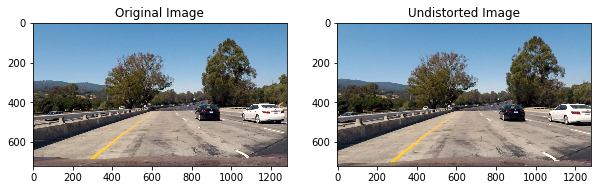

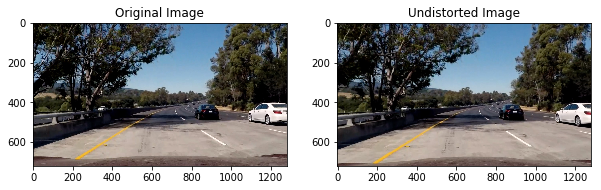

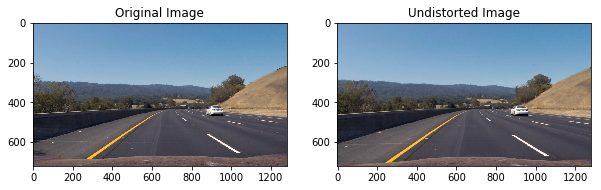

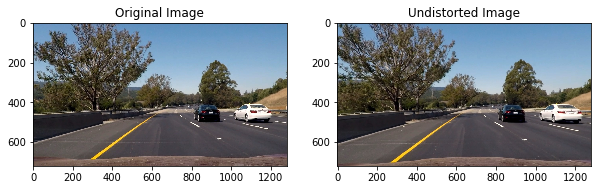

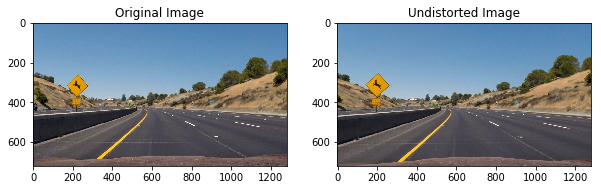

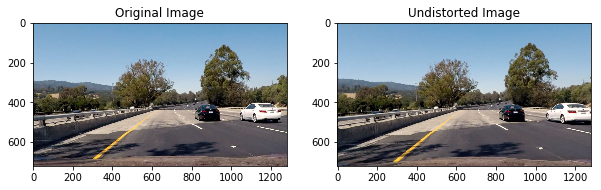

In [13]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    undistort(image)

In [14]:
def perspective_transform(img, display=True, read = True):
    if read:
        undist = undistort(img, show = False)
    else:
        undist = undistort(img, show = False, read=False) 
    img_size = (undist.shape[1], undist.shape[0])
    
    src = np.float32([[492, 485],[805, 485],
                      [1245, 720],[42, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(undist, M, img_size)
    if display:
        plot_2((undist, warped), ('Undistorted', 'Warped'))
    else:
        return warped, M

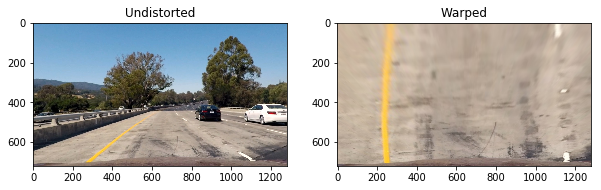

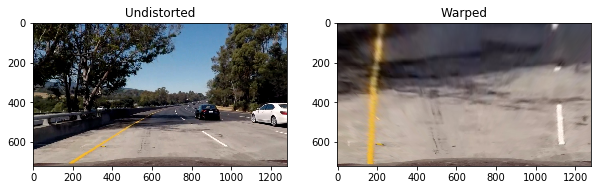

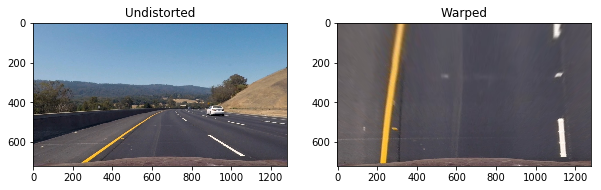

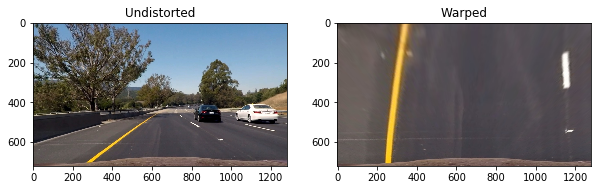

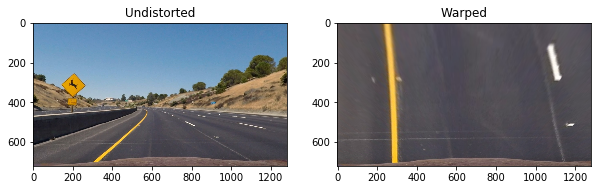

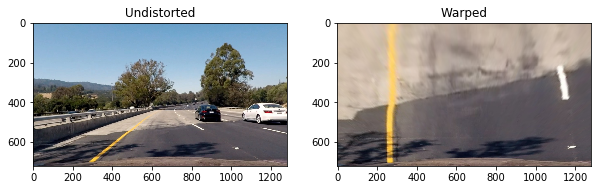

In [15]:
for image in glob.glob('test_images/test*.jpg'):
    perspective_transform(image)

In [16]:
def combined_binary(image, show=True):
    img, M = perspective_transform(image, display = False)

    s_chan = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2]
    l_chan = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:,:,0]
    b_chan = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)[:,:,2]   

    # Threshold color channel
    s_min = 181
    s_max = 255
    s_bin = np.zeros_like(s_chan)
    s_bin[(s_chan >= s_min) & 
             (s_chan <= s_max)] = 1
    
    b_min = 153
    b_max = 202
    b_bin = np.zeros_like(b_chan)
    b_bin[(b_chan >= b_min) & 
             (b_chan <= b_max)] = 1
    
    l_min = 220
    l_max = 255
    l_bin = np.zeros_like(l_chan)
    l_bin[(l_chan >= l_min) & 
             (l_chan <= l_max)] = 1

    combined_bin = np.zeros_like(s_bin)
    combined_bin[(l_bin == 1) | (b_bin == 1)] = 1

    if show == True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))    
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax1.set_title('Warped')    
        ax2.imshow(combined_bin, cmap='gray')
        ax2.set_title('Combined Binary')
    else: 
        return combined_bin

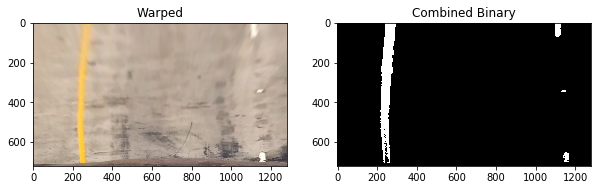

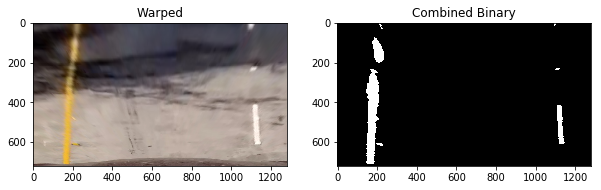

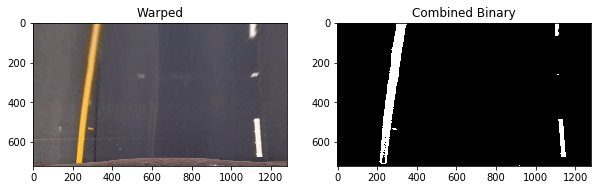

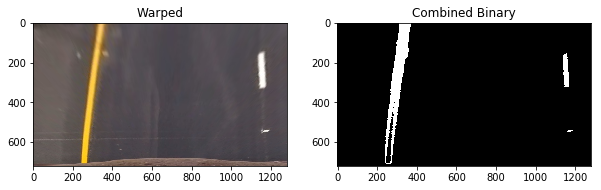

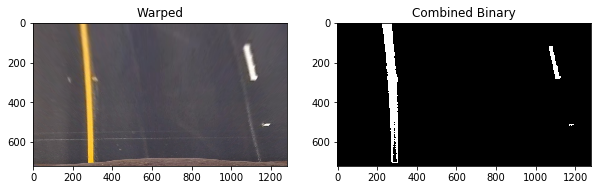

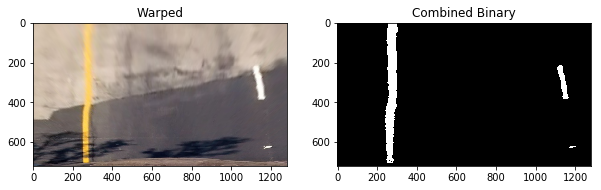

In [17]:
for image in glob.glob('test_images/test*.jpg'):
    combined_binary(image)

In [18]:
def fit_polynomial(image):
    combined_bin = combined_binary(image, show=False)
    
    rightx = []
    righty = []
    leftx = []
    lefty = []
    
    x, y = np.nonzero(np.transpose(combined_bin))
    i = 720
    j = 630
    while j >= 0:
        histogram = np.sum(combined_bin[j:i,:], axis=0)
        left_peak = np.argmax(histogram[:640])
        x_idx = np.where((((left_peak - 25) < x)&(x < (left_peak + 25))&((y > j) & (y < i))))
        x_window, y_window = x[x_idx], y[x_idx]
        if np.sum(x_window) != 0:
            leftx.extend(x_window.tolist())
            lefty.extend(y_window.tolist())

        right_peak = np.argmax(histogram[640:]) + 640
        x_idx = np.where((((right_peak - 25) < x)&(x < (right_peak + 25))&((y > j) & (y < i))))
        x_window, y_window = x[x_idx], y[x_idx]
        if np.sum(x_window) != 0:
            rightx.extend(x_window.tolist())
            righty.extend(y_window.tolist())
        i -= 90
        j -= 90
    y_eval = 720
    lefty = np.array(lefty).astype(np.float32)
    leftx = np.array(leftx).astype(np.float32)
    
    righty = np.array(righty).astype(np.float32)
    rightx = np.array(rightx).astype(np.float32)
    
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    
    rightx_int = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    rightx = np.append(rightx,rightx_int)
    righty = np.append(righty, 720)
    
    rightx = np.append(rightx,right_fit[0]*0**2 + right_fit[1]*0 + right_fit[2])
    righty = np.append(righty, 0)
    leftx_int = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    
    leftx = np.append(leftx, leftx_int)
    lefty = np.append(lefty, 720)
    
    leftx = np.append(leftx,left_fit[0]*0**2 + left_fit[1]*0 + left_fit[2])
    lefty = np.append(lefty, 0)
    
    lsort = np.argsort(lefty)
    rsort = np.argsort(righty)
    
    lefty = lefty[lsort]
    leftx = leftx[lsort]
    
    righty = righty[rsort]
    rightx = rightx[rsort]
    
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    
    # Radius calculation
    ym_per_pix = 10./720 # meters per pixel in y dimension
    xm_per_pix = 3.7/900 # meteres per pixel in x dimension
    
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])
    
    
    # Offset from center
    center = abs(710 - ((rightx_int+leftx_int)/2))
    offset = 0
    img_size = (combined_bin.shape[1], combined_bin.shape[0])
    
    src = np.float32([[492, 485],[805, 485],
                      [1245, 720],[42, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(combined_bin).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, lefty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, righty]))])
    pts = np.hstack((pts_left, pts_right))
    
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    warp_again = cv2.warpPerspective(color_warp, Minv, (combined_bin.shape[1], combined_bin.shape[0]))
    finale = cv2.addWeighted(mpimg.imread(image), 1, warp_again, 0.5, 0)
    
    f, (ax1, ax2) = plt.subplots(1,2, figsize=(10, 6))
    f.tight_layout()
    
    ax1.imshow(cv2.cvtColor((perspective_transform(image, display=False)[0]), cv2.COLOR_BGR2RGB))
    ax1.set_xlim(0, 1280)
    ax1.set_ylim(0, 720)
    
    ax1.plot(left_fitx, lefty, color='red', linewidth=3)
    ax1.plot(right_fitx, righty, color='blue', linewidth=3)
    
    ax1.set_title('Lane Lines', fontsize=16)
    ax1.invert_yaxis() # to visualize images
    
    ax2.imshow(finale)
    ax2.set_title('Lane Painted', fontsize=16)
    
    if center < 710:
        ax2.text(200, 100, 'Vehicle is on {:.2f} m left of center'.
                 format(center*3.7/900),
                 color='white', fontsize=11)
    else:
        ax2.text(200, 100, 'Vehicle is on {:.2f} m right of center'.
                 format(center*3.7/900),
                 color='white', fontsize=11)
    ax2.text(200, 175, 'Curvature radius = {} m'.
             format(int((left_curverad + right_curverad)/2)),
             color='white', fontsize=11)

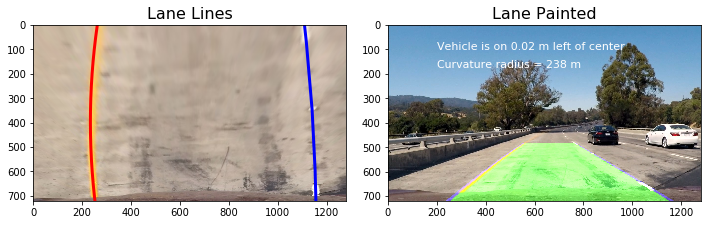

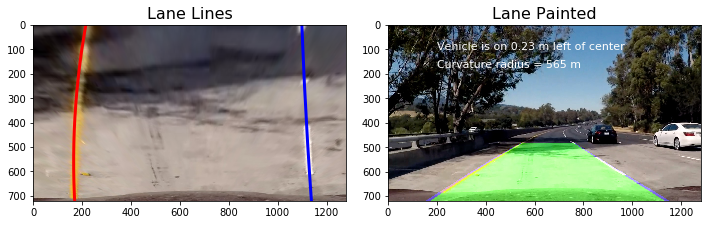

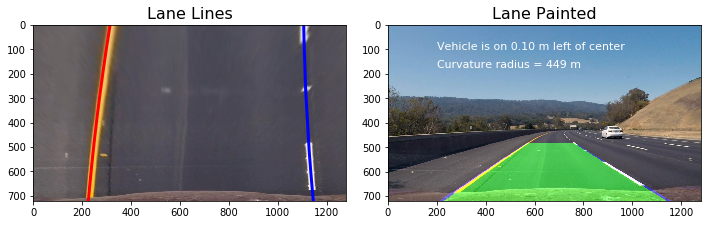

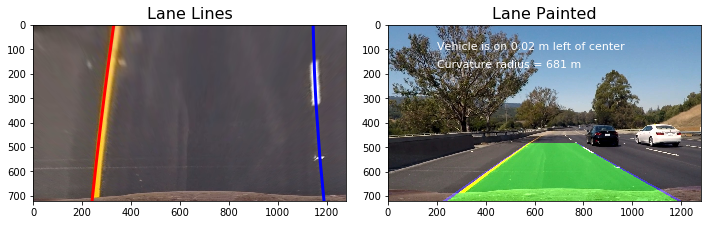

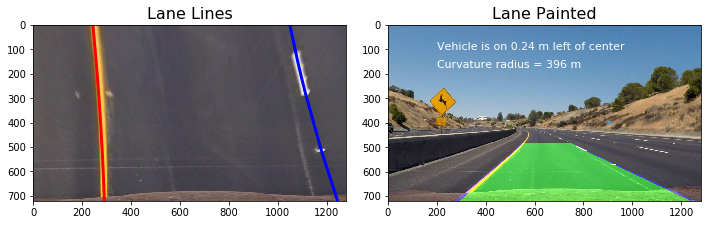

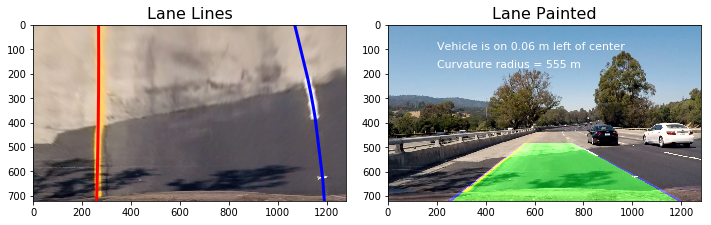

In [19]:
for image in glob.glob('test_images/test*.jpg'):
    fit_polynomial(image)

In [20]:
class Line():
    def __init__(self):
        self.found = False

        # X and y values of lanes in prev frame
        self.X = None
        self.Y = None

        # Recent interceptions
        self.interceptions = deque(maxlen=10)
        self.interceptions_top = deque(maxlen=10)

        # Last interception
        self.last_interception = None
        self.last_intersection_top = None

        self.radius = None

        # Recent polynomial coefficients
        self.fit0 = deque(maxlen=10)
        self.fit1 = deque(maxlen=10)
        self.fit2 = deque(maxlen=10)
        self.fitx = None
        self.points = []

        self.frame_number = 0

    def found_search(self, x, y):
        # Do sliding window search around previously found polynomial line
        xvals = []
        yvals = []
        if self.found == True:
            i = 720
            j = 630
            while j >= 0:
                yval = np.mean([i, j])
                xval = (np.mean(self.fit0)) * yval ** 2 + (np.mean(self.fit1)) * yval + (np.mean(self.fit2))
                x_idx = np.where((((xval - 25) < x) & (x < (xval + 25)) & ((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    np.append(xvals, x_window)
                    np.append(yvals, y_window)
                i -= 90
                j -= 90
        if np.sum(xvals) == 0:
            self.found = False  # If no lane pixels were detected then perform blind search
        return xvals, yvals, self.found

    def blind_search(self, x, y, image):
        # Find polynomial lines from scratch
        xvals = []
        yvals = []
        if self.found == False:
            i = 720
            j = 630
            while j >= 0:
                histogram = np.sum(image[j:i, :], axis=0)
                if self == Right_Lane:
                    peak = np.argmax(histogram[640:]) + 640
                else:
                    peak = np.argmax(histogram[:640])
                x_idx = np.where((((peak - 25) < x) & (x < (peak + 25)) & ((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    xvals.extend(x_window)
                    yvals.extend(y_window)
                i -= 90
                j -= 90
        if np.sum(xvals) > 0:
            self.found = True
        else:
            yvals = self.Y
            xvals = self.X
        return xvals, yvals, self.found

    def curvature_calc(self, xvals, yvals):
        y_eval = 720
        
        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 10/720 
        xm_per_pix = 3.7/900 
        
        
        very_fit_cr = np.polyfit(yvals*ym_per_pix, xvals*xm_per_pix, 2)

        rad = ((1 + (2*very_fit_cr[0]*y_eval*ym_per_pix + very_fit_cr[1])**2)**1.5) / np.absolute(2*very_fit_cr[0])

        #print('Rad = ', rad)
        return rad

    def sort_values(self, xvals, yvals):
        sorted_index = np.argsort(yvals)
        sorted_yvals = yvals[sorted_index]
        sorted_xvals = xvals[sorted_index]
        return sorted_xvals, sorted_yvals

    def get_interceptions(self, polynomial):
        bottom = polynomial[0] * 720 ** 2 + polynomial[1] * 720 + polynomial[2]
        top = polynomial[0] * 0 ** 2 + polynomial[1] * 0 + polynomial[2]
        return bottom, top

In [21]:
Left_Lane = Line()
Right_Lane = Line()

In [22]:
src = np.float32([[492, 485], [805, 485],
                  [1245, 720], [42, 720]])
dst = np.float32([[0, 0], [1280, 0],
                  [1250, 720], [40, 720]])
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

In [23]:
def process_frame(image):
    img_size = (image.shape[1], image.shape[0])

    undist = cv2.undistort(image, cameraMatrix, distCoeffs, None, cameraMatrix)
    warped = cv2.warpPerspective(undist, M, img_size)

    b_channel = cv2.cvtColor(warped, cv2.COLOR_RGB2Lab)[:, :, 2]
    l_channel = cv2.cvtColor(warped, cv2.COLOR_RGB2LUV)[:, :, 0]

    b_thresh_min = 145
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1

    l_thresh_min = 215
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1

    combined_bin = np.zeros_like(b_binary)
    combined_bin[(l_binary == 1) | (b_binary == 1)] = 1

    x, y = np.nonzero(np.transpose(combined_bin))

    if Left_Lane.found == True:
        leftx, lefty, Left_Lane.found = Left_Lane.found_search(x, y)

    if Right_Lane.found == True:
        rightx, righty, Right_Lane.found = Right_Lane.found_search(x, y)

    if Right_Lane.found == False:
        rightx, righty, Right_Lane.found = Right_Lane.blind_search(x, y, combined_bin)

    if Left_Lane.found == False:
        leftx, lefty, Left_Lane.found = Left_Lane.blind_search(x, y, combined_bin)

    lefty = np.array(lefty).astype(np.float32)
    leftx = np.array(leftx).astype(np.float32)
    righty = np.array(righty).astype(np.float32)
    rightx = np.array(rightx).astype(np.float32)

    # Fit left lane

    left_fit = np.polyfit(lefty, leftx, 2)

    new_left_interception, new_left_interception_top = Left_Lane.get_interceptions(left_fit)

    # Average interceptions through frames
    Left_Lane.interceptions.append(new_left_interception)
    Left_Lane.interceptions_top.append(new_left_interception_top)

    new_left_interception = np.mean(Left_Lane.interceptions)
    new_left_interception_top = np.mean(Left_Lane.interceptions_top)

    Left_Lane.last_interception = new_left_interception
    Left_Lane.last_intersection_top = new_left_interception_top

    # Add averaged interceptions to current x and y
    leftx = np.append(leftx, new_left_interception)
    lefty = np.append(lefty, 720)

    leftx = np.append(leftx, new_left_interception_top)
    lefty = np.append(lefty, 0)

    # Sort detected pixels based on the y's
    leftx, lefty = Left_Lane.sort_values(leftx, lefty)

    Left_Lane.X = leftx
    Left_Lane.Y = lefty

    # Recalculate polynomial with intercepts
    left_fit = np.polyfit(lefty, leftx, 2)

    # Average through frames
    Left_Lane.fit0.append(left_fit[0])
    Left_Lane.fit1.append(left_fit[1])
    Left_Lane.fit2.append(left_fit[2])
    left_fit = [np.mean(Left_Lane.fit0),
                np.mean(Left_Lane.fit1),
                np.mean(Left_Lane.fit2)]

    # Fit polynomial to detected pixels
    left_fitx = left_fit[0] * lefty ** 2 + left_fit[1] * lefty + left_fit[2]
    Left_Lane.fitx = left_fitx


    # Fit right lane:

    right_fit = np.polyfit(righty, rightx, 2)

    new_right_interception, new_right_interception_top = Right_Lane.get_interceptions(right_fit)

    # Average interceptions through frames
    Right_Lane.interceptions.append(new_right_interception)
    new_right_interception = np.mean(Right_Lane.interceptions)

    Right_Lane.interceptions_top.append(new_right_interception_top)
    new_right_interception_top = np.mean(Right_Lane.interceptions_top)

    Right_Lane.last_interception = new_right_interception
    Right_Lane.last_intersection_top = new_right_interception_top

    # Add averaged interceptions to current x and y

    rightx = np.append(rightx, new_right_interception)
    righty = np.append(righty, 720)

    rightx = np.append(rightx, new_right_interception_top)
    righty = np.append(righty, 0)

    # Sort detected pixels based on the y's
    rightx, righty = Right_Lane.sort_values(rightx, righty)

    Right_Lane.X = rightx
    Right_Lane.Y = righty

    # Recalculate polynomial with intercepts
    right_fit = np.polyfit(righty, rightx, 2)

    # Average through frames
    Right_Lane.fit0.append(right_fit[0])
    Right_Lane.fit1.append(right_fit[1])
    Right_Lane.fit2.append(right_fit[2])
    right_fit = [np.mean(Right_Lane.fit0), np.mean(Right_Lane.fit1), np.mean(Right_Lane.fit2)]

    # Fit polynomial to detected pixels
    right_fitx = right_fit[0] * righty ** 2 + right_fit[1] * righty + right_fit[2]
    Right_Lane.fitx = right_fitx



    # Compute radius of curvature for each lane in meters
    left_curverad = Left_Lane.curvature_calc(leftx, lefty)
    right_curverad = Right_Lane.curvature_calc(rightx, righty)

    # Print the curvature every 4 frames
    if Left_Lane.frame_number % 4 == 0:
        Left_Lane.radius = left_curverad
        Right_Lane.radius = right_curverad

    # Calculate offset from center
    position = (new_right_interception + new_left_interception) / 2
    print(position)
    distance_from_center = abs((710 - position) * 3.7 / 900)

    warp_zero = np.zeros_like(combined_bin).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    pts_left = np.array([np.flipud(np.transpose(np.vstack([Left_Lane.fitx, Left_Lane.Y])))])

    pts_right = np.array([np.transpose(np.vstack([right_fitx, Right_Lane.Y]))])

    pts = np.hstack((pts_left, pts_right))

    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0, 0, 255), thickness=40)
    cv2.fillPoly(color_warp, np.int_(pts), (40, 255, 40))

    unwarped_lanes = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0]))
    finale = cv2.addWeighted(undist, 1, unwarped_lanes, 0.5, 0)

    if position > 710:
        cv2.putText(finale, 'Vehicle is on {:.2f}m left of center'.format(distance_from_center), (100, 80),
                    fontFace=16, fontScale=1, color=(255, 255, 255), thickness=2)
    else:
        cv2.putText(finale, 'Vehicle is on {:.2f}m right of center'.format(distance_from_center), (100, 80),
                    fontFace=16, fontScale=1, color=(255, 255, 255), thickness=2)

    cv2.putText(finale, 'Radius of Curvature {}(m)'.format(int((Left_Lane.radius + Right_Lane.radius) / 2)), (120, 140),
                fontFace=16, fontScale=1, color=(255, 255, 255), thickness=2)
    Left_Lane.frame_number += 1
    
    return finale

In [24]:
video_output = 'result.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_frame) 
white_clip.write_videofile(video_output, audio=False)

748.821521479
[MoviePy] >>>> Building video result.mp4
[MoviePy] Writing video result.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

748.821521479


  0%|          | 1/1261 [00:00<04:04,  5.15it/s]

748.015948761


  0%|          | 2/1261 [00:00<03:56,  5.32it/s]

747.160278804


  0%|          | 3/1261 [00:00<03:55,  5.35it/s]

746.679119589


  0%|          | 4/1261 [00:00<03:55,  5.33it/s]

746.419732078


  0%|          | 5/1261 [00:00<03:56,  5.32it/s]

745.685811953


  0%|          | 6/1261 [00:01<03:56,  5.32it/s]

745.82767146


  1%|          | 7/1261 [00:01<03:55,  5.33it/s]

747.632520157


  1%|          | 8/1261 [00:01<03:53,  5.37it/s]

748.85345385


  1%|          | 9/1261 [00:01<03:51,  5.40it/s]

749.780367731


  1%|          | 10/1261 [00:01<03:50,  5.42it/s]

750.117251287


  1%|          | 11/1261 [00:02<03:49,  5.44it/s]

750.530947175


  1%|          | 12/1261 [00:02<03:49,  5.43it/s]

751.254305977


  1%|          | 13/1261 [00:02<03:49,  5.44it/s]

751.616047578


  1%|          | 14/1261 [00:02<03:48,  5.45it/s]

751.702344219


  1%|          | 15/1261 [00:02<03:48,  5.46it/s]

752.04091387


  1%|▏         | 16/1261 [00:02<03:48,  5.45it/s]

751.743387699


  1%|▏         | 17/1261 [00:03<03:48,  5.44it/s]

749.81320633


  1%|▏         | 18/1261 [00:03<03:48,  5.43it/s]

748.203783125


  2%|▏         | 19/1261 [00:03<03:48,  5.44it/s]

746.722001045


  2%|▏         | 20/1261 [00:03<03:48,  5.44it/s]

747.016938353


  2%|▏         | 21/1261 [00:03<03:47,  5.44it/s]

747.26529957


  2%|▏         | 22/1261 [00:04<03:47,  5.45it/s]

746.974818097


  2%|▏         | 23/1261 [00:04<03:47,  5.45it/s]

746.670496647


  2%|▏         | 24/1261 [00:04<03:46,  5.46it/s]

746.241222157


  2%|▏         | 25/1261 [00:04<03:46,  5.46it/s]

745.472530857


  2%|▏         | 26/1261 [00:04<03:45,  5.47it/s]

744.611086344


  2%|▏         | 27/1261 [00:04<03:45,  5.48it/s]

743.369481827


  2%|▏         | 28/1261 [00:05<03:44,  5.48it/s]

742.320060813


  2%|▏         | 29/1261 [00:05<03:44,  5.48it/s]

740.951796594


  2%|▏         | 30/1261 [00:05<03:44,  5.49it/s]

738.367427827


  2%|▏         | 31/1261 [00:05<03:44,  5.49it/s]

735.939298385


  3%|▎         | 32/1261 [00:05<03:43,  5.50it/s]

734.162979156


  3%|▎         | 33/1261 [00:05<03:42,  5.51it/s]

733.728560716


  3%|▎         | 34/1261 [00:06<03:42,  5.52it/s]

733.598493856


  3%|▎         | 35/1261 [00:06<03:41,  5.53it/s]

733.815816036


  3%|▎         | 36/1261 [00:06<03:41,  5.53it/s]

734.050692355


  3%|▎         | 37/1261 [00:06<03:40,  5.54it/s]

734.743955691


  3%|▎         | 38/1261 [00:06<03:40,  5.55it/s]

734.859569798


  3%|▎         | 39/1261 [00:07<03:39,  5.56it/s]

735.008964297


  3%|▎         | 40/1261 [00:07<03:39,  5.56it/s]

735.410121981


  3%|▎         | 41/1261 [00:07<03:39,  5.56it/s]

735.972400356


  3%|▎         | 43/1261 [00:07<03:40,  5.51it/s]

736.291623924
735.639212


  4%|▎         | 45/1261 [00:08<03:40,  5.52it/s]

735.231689809
736.342357912


  4%|▎         | 47/1261 [00:08<03:39,  5.53it/s]

737.291679206
737.998909023


  4%|▍         | 49/1261 [00:08<03:39,  5.52it/s]

738.850642485
739.928098666


  4%|▍         | 51/1261 [00:09<03:39,  5.50it/s]

740.738716579


  4%|▍         | 52/1261 [00:09<03:40,  5.48it/s]

741.22473476


  4%|▍         | 53/1261 [00:09<03:40,  5.47it/s]

741.341898629
741.51978685


  4%|▍         | 55/1261 [00:10<03:40,  5.46it/s]

741.384033316


  4%|▍         | 56/1261 [00:10<03:41,  5.44it/s]

739.878206068


  5%|▍         | 57/1261 [00:10<03:41,  5.43it/s]

738.729808302
737.766007707


  5%|▍         | 59/1261 [00:10<03:41,  5.43it/s]

738.094049009


  5%|▍         | 60/1261 [00:11<03:41,  5.42it/s]

738.085490607
737.729437624


  5%|▍         | 62/1261 [00:11<03:41,  5.41it/s]

737.288693716
736.372729569


  5%|▌         | 64/1261 [00:11<03:41,  5.41it/s]

735.392597443
734.357246988


  5%|▌         | 66/1261 [00:12<03:41,  5.40it/s]

733.149344412
731.77479162


  5%|▌         | 68/1261 [00:12<03:41,  5.38it/s]

730.169620645


  5%|▌         | 69/1261 [00:12<03:41,  5.38it/s]

727.239286726
724.576798316


  6%|▌         | 71/1261 [00:13<03:41,  5.38it/s]

724.055349641


  6%|▌         | 72/1261 [00:13<03:41,  5.37it/s]

723.298771467


  6%|▌         | 73/1261 [00:13<03:41,  5.36it/s]

722.904837641
722.007128036


  6%|▌         | 75/1261 [00:14<03:41,  5.35it/s]

720.995533983


  6%|▌         | 76/1261 [00:14<03:41,  5.34it/s]

719.199827808
717.625749615


  6%|▌         | 78/1261 [00:14<03:41,  5.34it/s]

716.612172643


  6%|▋         | 79/1261 [00:14<03:42,  5.32it/s]

715.817520156


  6%|▋         | 80/1261 [00:15<03:42,  5.32it/s]

715.009181663
712.222293093


  7%|▋         | 82/1261 [00:15<03:41,  5.31it/s]

709.902216656


  7%|▋         | 83/1261 [00:15<03:41,  5.31it/s]

708.067984403
708.018985986


  7%|▋         | 85/1261 [00:16<03:41,  5.31it/s]

707.999279527
708.506336497


  7%|▋         | 87/1261 [00:16<03:41,  5.30it/s]

708.465819737
707.165156946


  7%|▋         | 89/1261 [00:16<03:40,  5.30it/s]

705.659851506
704.48260569


  7%|▋         | 91/1261 [00:17<03:40,  5.30it/s]

703.598291129
702.92608123


  7%|▋         | 93/1261 [00:17<03:40,  5.29it/s]

702.236548435
700.432334275


  8%|▊         | 95/1261 [00:17<03:40,  5.29it/s]

698.722399489
699.427317397


  8%|▊         | 97/1261 [00:18<03:39,  5.29it/s]

700.148680581


  8%|▊         | 98/1261 [00:18<03:40,  5.28it/s]

701.535507334
702.794612118


  8%|▊         | 100/1261 [00:18<03:39,  5.29it/s]

703.671750948
703.58296332


  8%|▊         | 102/1261 [00:19<03:39,  5.28it/s]

702.99397447
702.569297289


  8%|▊         | 104/1261 [00:19<03:39,  5.28it/s]

702.636901828
703.145979775


  8%|▊         | 106/1261 [00:20<03:39,  5.27it/s]

701.791421079
701.163696297


  9%|▊         | 108/1261 [00:20<03:38,  5.27it/s]

701.127431404
702.644350427


  9%|▊         | 110/1261 [00:20<03:38,  5.26it/s]

704.18308312
706.694929188


  9%|▉         | 112/1261 [00:21<03:38,  5.26it/s]

709.579447634
712.241079726


  9%|▉         | 114/1261 [00:21<03:38,  5.26it/s]

714.555185416
716.571477098


  9%|▉         | 116/1261 [00:22<03:37,  5.26it/s]

717.974660569
719.123285496


  9%|▉         | 118/1261 [00:22<03:37,  5.26it/s]

719.925035719


  9%|▉         | 119/1261 [00:22<03:37,  5.25it/s]

719.046379299
719.01863395


 10%|▉         | 121/1261 [00:23<03:36,  5.26it/s]

719.183100248


 10%|▉         | 122/1261 [00:23<03:36,  5.26it/s]

720.377846418
721.585911657


 10%|▉         | 124/1261 [00:23<03:36,  5.26it/s]

722.452089583
723.380471608


 10%|▉         | 126/1261 [00:23<03:35,  5.26it/s]

724.389661668
725.407999003


 10%|█         | 128/1261 [00:24<03:35,  5.26it/s]

726.558833173
728.39628878


 10%|█         | 130/1261 [00:24<03:35,  5.25it/s]

729.443324663


 10%|█         | 131/1261 [00:24<03:35,  5.25it/s]

729.884895582
729.959867897


 11%|█         | 133/1261 [00:25<03:34,  5.25it/s]

730.319323037


 11%|█         | 134/1261 [00:25<03:34,  5.25it/s]

731.658251248
732.983287212


 11%|█         | 136/1261 [00:25<03:34,  5.25it/s]

734.868175281
736.623889615


 11%|█         | 138/1261 [00:26<03:34,  5.25it/s]

738.364609257
740.186496148


 11%|█         | 140/1261 [00:26<03:33,  5.25it/s]

741.809215873
743.834000354


 11%|█▏        | 142/1261 [00:27<03:33,  5.24it/s]

744.857989558
745.342019697


 11%|█▏        | 144/1261 [00:27<03:33,  5.24it/s]

744.622115177
743.936767715


 12%|█▏        | 146/1261 [00:27<03:32,  5.24it/s]

743.013590582
743.424472342


 12%|█▏        | 148/1261 [00:28<03:32,  5.24it/s]

743.522359932
743.206098413


 12%|█▏        | 150/1261 [00:28<03:32,  5.24it/s]

742.983872654
742.419489598


 12%|█▏        | 152/1261 [00:29<03:31,  5.24it/s]

742.150386164
741.909378038


 12%|█▏        | 154/1261 [00:29<03:31,  5.24it/s]

742.138725734
742.098352472


 12%|█▏        | 156/1261 [00:29<03:31,  5.24it/s]

741.917335328
740.246728


 13%|█▎        | 158/1261 [00:30<03:30,  5.23it/s]

738.480259024
737.198119482


 13%|█▎        | 160/1261 [00:30<03:30,  5.24it/s]

735.756519135
734.62995512


 13%|█▎        | 162/1261 [00:30<03:29,  5.24it/s]

733.4704299
732.523216531


 13%|█▎        | 164/1261 [00:31<03:29,  5.24it/s]

730.952087673
729.477371992


 13%|█▎        | 166/1261 [00:31<03:28,  5.24it/s]

728.427072218
727.510501888


 13%|█▎        | 168/1261 [00:32<03:28,  5.24it/s]

727.013902598
726.070864369


 13%|█▎        | 170/1261 [00:32<03:28,  5.23it/s]

725.424422641
724.71979693


 14%|█▎        | 172/1261 [00:32<03:27,  5.24it/s]

724.66338886
724.320784832


 14%|█▍        | 174/1261 [00:33<03:27,  5.24it/s]

723.942774884
723.492511168


 14%|█▍        | 176/1261 [00:33<03:27,  5.24it/s]

723.148405214
722.232885117


 14%|█▍        | 178/1261 [00:33<03:26,  5.24it/s]

721.323071831
720.275256565


 14%|█▍        | 180/1261 [00:34<03:26,  5.23it/s]

719.397181226
718.560101538


 14%|█▍        | 182/1261 [00:34<03:26,  5.23it/s]

717.173555348
716.287333114


 15%|█▍        | 184/1261 [00:35<03:25,  5.23it/s]

716.706127829
717.069313512


 15%|█▍        | 186/1261 [00:35<03:25,  5.23it/s]

716.744689897
716.874481248


 15%|█▍        | 188/1261 [00:35<03:25,  5.23it/s]

716.598226908
716.430894674


 15%|█▌        | 190/1261 [00:36<03:24,  5.23it/s]

716.551480805
716.345876365


 15%|█▌        | 192/1261 [00:36<03:24,  5.23it/s]

716.997738194
717.338185388


 15%|█▌        | 194/1261 [00:37<03:24,  5.22it/s]

717.078638971
717.603832159


 16%|█▌        | 196/1261 [00:37<03:23,  5.23it/s]

719.320134175
721.123387996


 16%|█▌        | 198/1261 [00:37<03:23,  5.22it/s]

723.05573341
724.97797049


 16%|█▌        | 200/1261 [00:38<03:23,  5.22it/s]

726.393007572
728.852445906


 16%|█▌        | 202/1261 [00:38<03:22,  5.22it/s]

729.899894488
730.627129009


 16%|█▌        | 204/1261 [00:39<03:22,  5.22it/s]

730.431916939
729.455817788


 16%|█▋        | 206/1261 [00:39<03:22,  5.22it/s]

727.601996685
725.995660135


 16%|█▋        | 208/1261 [00:39<03:21,  5.22it/s]

725.517286408
725.079068651


 17%|█▋        | 210/1261 [00:40<03:21,  5.23it/s]

724.837678669
723.792242158


 17%|█▋        | 212/1261 [00:40<03:20,  5.23it/s]

723.155401065
723.365962564


 17%|█▋        | 214/1261 [00:40<03:20,  5.23it/s]

723.989653703
724.271927346


 17%|█▋        | 216/1261 [00:41<03:19,  5.23it/s]

724.133900772
723.425769017


 17%|█▋        | 218/1261 [00:41<03:19,  5.23it/s]

721.53781637
719.643639225


 17%|█▋        | 220/1261 [00:42<03:19,  5.23it/s]

717.716621011
716.200965235


 18%|█▊        | 222/1261 [00:42<03:18,  5.23it/s]

714.759129914
713.197789998


 18%|█▊        | 224/1261 [00:42<03:18,  5.23it/s]

711.811280992
710.592337425


 18%|█▊        | 226/1261 [00:43<03:17,  5.23it/s]

709.672363056
709.313329875


 18%|█▊        | 228/1261 [00:43<03:17,  5.23it/s]

709.174703685
708.694660092


 18%|█▊        | 230/1261 [00:44<03:17,  5.23it/s]

707.867693871
706.526149655


 18%|█▊        | 232/1261 [00:44<03:16,  5.23it/s]

704.968597914
703.872134152


 19%|█▊        | 234/1261 [00:44<03:16,  5.23it/s]

702.50379898
701.301452489


 19%|█▊        | 236/1261 [00:45<03:16,  5.23it/s]

699.988403214
697.518591524


 19%|█▉        | 238/1261 [00:45<03:15,  5.23it/s]

694.868011605
692.542468427


 19%|█▉        | 240/1261 [00:45<03:15,  5.23it/s]

691.01511425
689.38715319


 19%|█▉        | 242/1261 [00:46<03:14,  5.23it/s]

688.020625809


 19%|█▉        | 243/1261 [00:46<03:14,  5.22it/s]

685.861626338
683.931702329


 19%|█▉        | 245/1261 [00:46<03:14,  5.23it/s]

683.238183072


 20%|█▉        | 246/1261 [00:47<03:14,  5.22it/s]

682.387766592
682.359111952


 20%|█▉        | 248/1261 [00:47<03:13,  5.23it/s]

682.39992222
682.260841103


 20%|█▉        | 250/1261 [00:47<03:13,  5.22it/s]

681.570807939
681.000907604


 20%|█▉        | 252/1261 [00:48<03:13,  5.22it/s]

680.513746066
679.958080787


 20%|██        | 254/1261 [00:48<03:12,  5.22it/s]

679.590562669


 20%|██        | 255/1261 [00:48<03:12,  5.22it/s]

678.16681685
677.048854243


 20%|██        | 257/1261 [00:49<03:12,  5.22it/s]

677.405626343
677.585253434


 21%|██        | 259/1261 [00:49<03:11,  5.22it/s]

677.978183774
678.50707349


 21%|██        | 261/1261 [00:49<03:11,  5.22it/s]

679.313474017


 21%|██        | 262/1261 [00:50<03:11,  5.22it/s]

680.207391522
680.557287205


 21%|██        | 264/1261 [00:50<03:10,  5.22it/s]

680.672496661
681.307273884


 21%|██        | 266/1261 [00:50<03:10,  5.22it/s]

681.972910718


 21%|██        | 267/1261 [00:51<03:10,  5.22it/s]

681.433425007
681.12917815


 21%|██▏       | 269/1261 [00:51<03:09,  5.22it/s]

680.848383694


 21%|██▏       | 270/1261 [00:51<03:09,  5.22it/s]

680.717280253
680.541840384


 22%|██▏       | 272/1261 [00:52<03:09,  5.22it/s]

680.287099679
680.40158355


 22%|██▏       | 274/1261 [00:52<03:08,  5.22it/s]

680.587041505
680.472599399


 22%|██▏       | 276/1261 [00:52<03:08,  5.22it/s]

680.930534123
681.353643163


 22%|██▏       | 278/1261 [00:53<03:08,  5.22it/s]

682.439932106


 22%|██▏       | 279/1261 [00:53<03:08,  5.22it/s]

682.993336561
683.393742018


 22%|██▏       | 281/1261 [00:53<03:07,  5.22it/s]

685.063411801


 22%|██▏       | 282/1261 [00:54<03:07,  5.22it/s]

686.097896877
687.529749832


 23%|██▎       | 284/1261 [00:54<03:07,  5.22it/s]

689.783750235
691.938080293


 23%|██▎       | 286/1261 [00:54<03:06,  5.22it/s]

693.670709904
695.492237758


 23%|██▎       | 288/1261 [00:55<03:06,  5.22it/s]

696.998882728
699.061958577


 23%|██▎       | 290/1261 [00:55<03:06,  5.22it/s]

701.168505419
702.039302252


 23%|██▎       | 292/1261 [00:55<03:05,  5.22it/s]

703.441713142
705.348467426


 23%|██▎       | 294/1261 [00:56<03:05,  5.22it/s]

706.29912135
707.210015329


 23%|██▎       | 296/1261 [00:56<03:04,  5.22it/s]

708.447871082


 24%|██▎       | 297/1261 [00:56<03:04,  5.22it/s]

709.485235548
709.844558972


 24%|██▎       | 299/1261 [00:57<03:04,  5.22it/s]

710.359461939
711.041702873


 24%|██▍       | 301/1261 [00:57<03:03,  5.23it/s]

711.495448029


 24%|██▍       | 302/1261 [00:57<03:03,  5.22it/s]

712.061379353
711.988012873


 24%|██▍       | 304/1261 [00:58<03:03,  5.23it/s]

711.920566009
712.745480101


 24%|██▍       | 306/1261 [00:58<03:02,  5.22it/s]

713.017451577
713.550713093


 24%|██▍       | 308/1261 [00:58<03:02,  5.23it/s]

714.477819665
715.165144781


 25%|██▍       | 310/1261 [00:59<03:01,  5.23it/s]

715.427824057
715.875696183


 25%|██▍       | 312/1261 [00:59<03:01,  5.23it/s]

716.412429628
716.883504423


 25%|██▍       | 314/1261 [01:00<03:01,  5.22it/s]

717.117828785
716.934391729


 25%|██▌       | 316/1261 [01:00<03:00,  5.22it/s]

716.866105688
718.104985654


 25%|██▌       | 318/1261 [01:00<03:00,  5.22it/s]

719.060502503
719.461152871


 25%|██▌       | 320/1261 [01:01<03:00,  5.22it/s]

720.195984415
720.717707405


 26%|██▌       | 322/1261 [01:01<02:59,  5.22it/s]

720.579416619
720.523167764


 26%|██▌       | 324/1261 [01:01<02:59,  5.23it/s]

721.092575651
721.036895726


 26%|██▌       | 326/1261 [01:02<02:58,  5.23it/s]

721.005192495
719.491526897


 26%|██▌       | 328/1261 [01:02<02:58,  5.23it/s]

718.357004083
718.761646937


 26%|██▌       | 330/1261 [01:03<02:58,  5.23it/s]

718.849592107
719.015827522


 26%|██▋       | 332/1261 [01:03<02:57,  5.23it/s]

719.462031766
719.740182882


 26%|██▋       | 334/1261 [01:03<02:57,  5.23it/s]

719.723752639
719.779207782


 27%|██▋       | 336/1261 [01:04<02:56,  5.23it/s]

720.140404297
720.530910967


 27%|██▋       | 338/1261 [01:04<02:56,  5.23it/s]

720.920553835
720.332689788


 27%|██▋       | 340/1261 [01:04<02:55,  5.23it/s]

719.857166191
719.636973829


 27%|██▋       | 342/1261 [01:05<02:55,  5.23it/s]

720.765676042
721.80309801


 27%|██▋       | 344/1261 [01:05<02:55,  5.24it/s]

722.720850417
723.607912271


 27%|██▋       | 346/1261 [01:06<02:54,  5.23it/s]

724.336185489
724.743140498


 28%|██▊       | 348/1261 [01:06<02:54,  5.24it/s]

724.900370031
725.086625001


 28%|██▊       | 350/1261 [01:06<02:54,  5.23it/s]

725.365787319


 28%|██▊       | 351/1261 [01:07<02:53,  5.23it/s]

725.390992548
724.223457524


 28%|██▊       | 353/1261 [01:07<02:53,  5.24it/s]

723.431129555


 28%|██▊       | 354/1261 [01:07<02:53,  5.23it/s]

724.490591677
725.291068457


 28%|██▊       | 356/1261 [01:07<02:52,  5.24it/s]

725.476180283
725.561663823


 28%|██▊       | 358/1261 [01:08<02:52,  5.23it/s]

725.374822447
724.890018515


 29%|██▊       | 360/1261 [01:08<02:52,  5.24it/s]

724.388499463
724.081328517


 29%|██▊       | 362/1261 [01:09<02:51,  5.23it/s]

723.77442835


 29%|██▉       | 363/1261 [01:09<02:51,  5.23it/s]

723.554307926
721.837776166


 29%|██▉       | 365/1261 [01:09<02:51,  5.24it/s]

721.685866894


 29%|██▉       | 366/1261 [01:09<02:51,  5.23it/s]

722.084428883
722.659431403


 29%|██▉       | 368/1261 [01:10<02:50,  5.23it/s]

723.606298678
724.812699078


 29%|██▉       | 370/1261 [01:10<02:50,  5.23it/s]

697.702054441
697.948170672


 30%|██▉       | 372/1261 [01:11<02:49,  5.23it/s]

698.633360579
699.019787355


 30%|██▉       | 374/1261 [01:11<02:49,  5.23it/s]

699.027336949


 30%|██▉       | 375/1261 [01:11<02:49,  5.23it/s]

697.693422147
696.062307713


 30%|██▉       | 377/1261 [01:12<02:49,  5.23it/s]

695.907188694


 30%|██▉       | 378/1261 [01:12<02:48,  5.23it/s]

695.386369182
694.842807724


 30%|███       | 380/1261 [01:12<02:48,  5.23it/s]

722.470479464
722.409972105


 30%|███       | 382/1261 [01:13<02:48,  5.23it/s]

720.930317055
719.445952144


 30%|███       | 384/1261 [01:13<02:47,  5.23it/s]

718.757151051
718.224986862


 31%|███       | 386/1261 [01:13<02:47,  5.23it/s]

717.800195873


 31%|███       | 387/1261 [01:14<02:47,  5.23it/s]

716.135246841
714.975544442


 31%|███       | 389/1261 [01:14<02:46,  5.23it/s]

713.920755495


 31%|███       | 390/1261 [01:14<02:46,  5.22it/s]

714.272360492
714.609055751


 31%|███       | 392/1261 [01:15<02:46,  5.22it/s]

715.679281505
716.724529419


 31%|███       | 394/1261 [01:15<02:46,  5.22it/s]

715.984955965


 31%|███▏      | 395/1261 [01:15<02:45,  5.22it/s]

715.283343298
715.103425515


 31%|███▏      | 397/1261 [01:16<02:45,  5.22it/s]

715.064872474


 32%|███▏      | 398/1261 [01:16<02:45,  5.22it/s]

714.858426291


 32%|███▏      | 399/1261 [01:16<02:45,  5.22it/s]

714.485042383
712.865977577


 32%|███▏      | 401/1261 [01:16<02:44,  5.22it/s]

711.379975319


 32%|███▏      | 402/1261 [01:17<02:44,  5.22it/s]

711.551365357


 32%|███▏      | 403/1261 [01:17<02:44,  5.21it/s]

711.403422103
705.985766883


 32%|███▏      | 405/1261 [01:17<02:44,  5.21it/s]

706.393191816


 32%|███▏      | 406/1261 [01:17<02:44,  5.21it/s]

693.147124283


 32%|███▏      | 407/1261 [01:18<02:43,  5.21it/s]

680.96648221
677.246530781


 32%|███▏      | 409/1261 [01:18<02:43,  5.21it/s]

676.505088151


 33%|███▎      | 410/1261 [01:18<02:43,  5.21it/s]

675.664950634


 33%|███▎      | 411/1261 [01:18<02:43,  5.21it/s]

674.813496819


 33%|███▎      | 412/1261 [01:19<02:43,  5.20it/s]

672.552609134
670.730741817


 33%|███▎      | 414/1261 [01:19<02:42,  5.20it/s]

675.135956955


 33%|███▎      | 415/1261 [01:19<02:42,  5.20it/s]

674.143035845
686.149838812


 33%|███▎      | 417/1261 [01:20<02:42,  5.20it/s]

696.750975123


 33%|███▎      | 418/1261 [01:20<02:42,  5.20it/s]

698.462552429


 33%|███▎      | 419/1261 [01:20<02:41,  5.20it/s]

697.361933554
696.351489109


 33%|███▎      | 421/1261 [01:20<02:41,  5.20it/s]

695.305977687


 33%|███▎      | 422/1261 [01:21<02:41,  5.20it/s]

694.115129172


 34%|███▎      | 423/1261 [01:21<02:41,  5.20it/s]

692.868964495
691.840514004


 34%|███▎      | 425/1261 [01:21<02:40,  5.20it/s]

690.258283581


 34%|███▍      | 426/1261 [01:22<02:40,  5.19it/s]

689.842302551


 34%|███▍      | 427/1261 [01:22<02:40,  5.19it/s]

689.355633068
689.138862393


 34%|███▍      | 429/1261 [01:22<02:40,  5.19it/s]

688.578942131


 34%|███▍      | 430/1261 [01:22<02:40,  5.19it/s]

687.960584069


 34%|███▍      | 431/1261 [01:23<02:39,  5.19it/s]

687.025070506
686.126808934


 34%|███▍      | 433/1261 [01:23<02:39,  5.19it/s]

685.290455661


 34%|███▍      | 434/1261 [01:23<02:39,  5.19it/s]

684.436982806


 34%|███▍      | 435/1261 [01:23<02:39,  5.19it/s]

683.54088694
681.777958637


 35%|███▍      | 437/1261 [01:24<02:38,  5.19it/s]

681.596857271


 35%|███▍      | 438/1261 [01:24<02:38,  5.18it/s]

681.223183155
680.951550555


 35%|███▍      | 440/1261 [01:24<02:38,  5.18it/s]

680.547937198
680.434421148


 35%|███▌      | 442/1261 [01:25<02:37,  5.18it/s]

680.063876654
679.623475993


 35%|███▌      | 444/1261 [01:25<02:37,  5.18it/s]

679.169871001
678.6544022


 35%|███▌      | 446/1261 [01:26<02:37,  5.18it/s]

678.023754354


 35%|███▌      | 447/1261 [01:26<02:37,  5.18it/s]

676.086437829
674.631149104


 36%|███▌      | 449/1261 [01:26<02:36,  5.18it/s]

674.639154753


 36%|███▌      | 450/1261 [01:26<02:36,  5.18it/s]

674.416601022
673.98130917


 36%|███▌      | 452/1261 [01:27<02:36,  5.18it/s]

673.677831532
673.295609031


 36%|███▌      | 454/1261 [01:27<02:35,  5.18it/s]

672.823289476
672.339291779


 36%|███▌      | 456/1261 [01:28<02:35,  5.18it/s]

672.040200992
671.907883237


 36%|███▋      | 458/1261 [01:28<02:35,  5.18it/s]

671.848200104


 36%|███▋      | 459/1261 [01:28<02:34,  5.18it/s]

670.596118781
669.798452219


 37%|███▋      | 461/1261 [01:29<02:34,  5.18it/s]

669.726638516


 37%|███▋      | 462/1261 [01:29<02:34,  5.18it/s]

670.341761668
671.092491219


 37%|███▋      | 464/1261 [01:29<02:33,  5.18it/s]

671.80174597
672.513606951


 37%|███▋      | 466/1261 [01:30<02:33,  5.18it/s]

672.327441239
672.033826084


 37%|███▋      | 468/1261 [01:30<02:33,  5.18it/s]

671.783096988
671.53332726


 37%|███▋      | 470/1261 [01:30<02:32,  5.18it/s]

671.161664776


 37%|███▋      | 471/1261 [01:31<02:32,  5.17it/s]

670.492251507
669.340723091


 38%|███▊      | 473/1261 [01:31<02:32,  5.18it/s]

669.202918267


 38%|███▊      | 474/1261 [01:31<02:32,  5.17it/s]

669.333906429
669.457364698


 38%|███▊      | 476/1261 [01:31<02:31,  5.17it/s]

670.288904316
671.093464176


 38%|███▊      | 478/1261 [01:32<02:31,  5.17it/s]

671.979081407


 38%|███▊      | 479/1261 [01:32<02:31,  5.17it/s]

672.87306662
673.77516786


 38%|███▊      | 481/1261 [01:32<02:30,  5.17it/s]

674.898633924


 38%|███▊      | 482/1261 [01:33<02:30,  5.17it/s]

676.008504986


 38%|███▊      | 483/1261 [01:33<02:30,  5.17it/s]

676.146620868
676.236726414


 38%|███▊      | 485/1261 [01:33<02:29,  5.17it/s]

676.901709845


 39%|███▊      | 486/1261 [01:33<02:29,  5.17it/s]

677.673997162
678.512075455


 39%|███▊      | 488/1261 [01:34<02:29,  5.17it/s]

679.103529644
679.715410494


 39%|███▉      | 490/1261 [01:34<02:29,  5.17it/s]

679.590538834
679.39572166


 39%|███▉      | 492/1261 [01:35<02:28,  5.17it/s]

679.644894555
679.885336812


 39%|███▉      | 494/1261 [01:35<02:28,  5.17it/s]

680.235253105
680.234575254


 39%|███▉      | 496/1261 [01:35<02:27,  5.17it/s]

680.144074257
679.784353549


 39%|███▉      | 498/1261 [01:36<02:27,  5.17it/s]

679.67407332
679.433254017


 40%|███▉      | 500/1261 [01:36<02:27,  5.17it/s]

680.071557784
680.238131648


 40%|███▉      | 502/1261 [01:37<02:26,  5.17it/s]

680.306842641
680.630040868


 40%|███▉      | 504/1261 [01:37<02:26,  5.18it/s]

681.10701135
681.639127181


 40%|████      | 506/1261 [01:37<02:25,  5.17it/s]

682.178741737


 40%|████      | 507/1261 [01:38<02:25,  5.17it/s]

682.810121368
683.349335891


 40%|████      | 509/1261 [01:38<02:25,  5.17it/s]

686.016170219


 40%|████      | 510/1261 [01:38<02:25,  5.17it/s]

688.053169961
689.876289075


 41%|████      | 512/1261 [01:38<02:24,  5.17it/s]

691.021160949
690.654509234


 41%|████      | 514/1261 [01:39<02:24,  5.17it/s]

690.173027784
689.629414807


 41%|████      | 516/1261 [01:39<02:23,  5.17it/s]

689.12855586
688.689496269


 41%|████      | 518/1261 [01:40<02:23,  5.17it/s]

688.072491789


 41%|████      | 519/1261 [01:40<02:23,  5.17it/s]

685.377441413
683.38269266


 41%|████▏     | 521/1261 [01:40<02:23,  5.17it/s]

683.147738441


 41%|████▏     | 522/1261 [01:40<02:22,  5.17it/s]

683.26851863
684.577601308


 42%|████▏     | 524/1261 [01:41<02:22,  5.17it/s]

685.464927569
686.21243122


 42%|████▏     | 526/1261 [01:41<02:22,  5.17it/s]

686.656436894


 42%|████▏     | 527/1261 [01:41<02:22,  5.17it/s]

687.008386402
687.381499953


 42%|████▏     | 529/1261 [01:42<02:21,  5.17it/s]

687.602777356


 42%|████▏     | 530/1261 [01:42<02:21,  5.16it/s]

687.50764414


 42%|████▏     | 531/1261 [01:42<02:21,  5.16it/s]

686.10486962
684.744431139


 42%|████▏     | 533/1261 [01:43<02:21,  5.16it/s]

684.709708378


 42%|████▏     | 534/1261 [01:43<02:20,  5.16it/s]

684.995714501


 42%|████▏     | 535/1261 [01:43<02:20,  5.16it/s]

685.353499969


 43%|████▎     | 536/1261 [01:43<02:20,  5.16it/s]

686.188577743
687.193748467


 43%|████▎     | 538/1261 [01:44<02:20,  5.16it/s]

688.700481404


 43%|████▎     | 539/1261 [01:44<02:20,  5.15it/s]

689.425034957


 43%|████▎     | 540/1261 [01:44<02:19,  5.15it/s]

690.206745231


 43%|████▎     | 541/1261 [01:44<02:19,  5.15it/s]

690.807230656


 43%|████▎     | 542/1261 [01:45<02:19,  5.15it/s]

691.299766068


 43%|████▎     | 543/1261 [01:45<02:19,  5.15it/s]

690.347261623


 43%|████▎     | 544/1261 [01:45<02:19,  5.15it/s]

689.514127248


 43%|████▎     | 545/1261 [01:45<02:19,  5.14it/s]

689.12298466


 43%|████▎     | 546/1261 [01:46<02:18,  5.14it/s]

688.679825989
689.288194392


 43%|████▎     | 548/1261 [01:46<02:18,  5.14it/s]

688.639524001


 44%|████▎     | 549/1261 [01:46<02:18,  5.14it/s]

688.844934669


 44%|████▎     | 550/1261 [01:46<02:18,  5.14it/s]

689.049181662


 44%|████▎     | 551/1261 [01:47<02:18,  5.14it/s]

689.005918577


 44%|████▍     | 552/1261 [01:47<02:18,  5.14it/s]

688.976844015


 44%|████▍     | 553/1261 [01:47<02:17,  5.13it/s]

689.384135184


 44%|████▍     | 554/1261 [01:47<02:17,  5.13it/s]

689.677225117


 44%|████▍     | 555/1261 [01:48<02:17,  5.13it/s]

689.752813463


 44%|████▍     | 556/1261 [01:48<02:17,  5.13it/s]

689.799893253


 44%|████▍     | 557/1261 [01:48<02:17,  5.13it/s]

688.734271751


 44%|████▍     | 558/1261 [01:48<02:17,  5.13it/s]

688.309683637


 44%|████▍     | 559/1261 [01:49<02:16,  5.12it/s]

688.227709689


 44%|████▍     | 560/1261 [01:49<02:16,  5.12it/s]

688.651927216


 44%|████▍     | 561/1261 [01:49<02:16,  5.12it/s]

688.830723323


 45%|████▍     | 562/1261 [01:49<02:16,  5.12it/s]

689.606923617


 45%|████▍     | 563/1261 [01:50<02:16,  5.12it/s]

689.638114959


 45%|████▍     | 564/1261 [01:50<02:16,  5.11it/s]

689.503772471


 45%|████▍     | 565/1261 [01:50<02:16,  5.11it/s]

689.609845323


 45%|████▍     | 566/1261 [01:50<02:15,  5.11it/s]

689.592235141


 45%|████▍     | 567/1261 [01:50<02:15,  5.11it/s]

689.435171794


 45%|████▌     | 568/1261 [01:51<02:15,  5.11it/s]

689.620110872


 45%|████▌     | 569/1261 [01:51<02:15,  5.11it/s]

688.390355166


 45%|████▌     | 570/1261 [01:51<02:15,  5.11it/s]

687.952470444


 45%|████▌     | 571/1261 [01:51<02:15,  5.11it/s]

687.608274291


 45%|████▌     | 572/1261 [01:52<02:14,  5.10it/s]

687.188063169


 45%|████▌     | 573/1261 [01:52<02:14,  5.10it/s]

687.261264978


 46%|████▌     | 574/1261 [01:52<02:14,  5.10it/s]

687.949285861


 46%|████▌     | 575/1261 [01:52<02:14,  5.10it/s]

688.147887434


 46%|████▌     | 576/1261 [01:52<02:14,  5.10it/s]

688.540648058


 46%|████▌     | 577/1261 [01:53<02:14,  5.09it/s]

689.581167495


 46%|████▌     | 578/1261 [01:53<02:14,  5.09it/s]

690.466494195


 46%|████▌     | 579/1261 [01:53<02:13,  5.09it/s]

692.384573601


 46%|████▌     | 580/1261 [01:54<02:13,  5.09it/s]

693.206496044


 46%|████▌     | 581/1261 [01:54<02:13,  5.08it/s]

693.790841622


 46%|████▌     | 583/1261 [01:54<02:13,  5.08it/s]

694.242149107
694.716136359


 46%|████▋     | 584/1261 [01:54<02:13,  5.08it/s]

694.66624478


 46%|████▋     | 585/1261 [01:55<02:13,  5.08it/s]

694.652870165


 46%|████▋     | 586/1261 [01:55<02:12,  5.08it/s]

694.91654959


 47%|████▋     | 587/1261 [01:55<02:12,  5.08it/s]

694.589796142


 47%|████▋     | 588/1261 [01:55<02:12,  5.08it/s]

694.261431519


 47%|████▋     | 589/1261 [01:56<02:12,  5.07it/s]

695.757874061
696.591374038


 47%|████▋     | 591/1261 [01:56<02:12,  5.07it/s]

697.455480178


 47%|████▋     | 592/1261 [01:56<02:11,  5.07it/s]

697.653590283


 47%|████▋     | 593/1261 [01:56<02:11,  5.07it/s]

696.253410571


 47%|████▋     | 594/1261 [01:57<02:11,  5.07it/s]

695.374540717


 47%|████▋     | 595/1261 [01:57<02:11,  5.07it/s]

694.190597752


 47%|████▋     | 596/1261 [01:57<02:11,  5.07it/s]

692.892812697


 47%|████▋     | 597/1261 [01:57<02:11,  5.07it/s]

691.6477045


 47%|████▋     | 598/1261 [01:58<02:10,  5.07it/s]

690.188993212


 48%|████▊     | 599/1261 [01:58<02:10,  5.07it/s]

686.784229796


 48%|████▊     | 600/1261 [01:58<02:10,  5.06it/s]

683.893279205


 48%|████▊     | 601/1261 [01:58<02:10,  5.06it/s]

681.606584064


 48%|████▊     | 602/1261 [01:58<02:10,  5.06it/s]

679.782415036


 48%|████▊     | 603/1261 [01:59<02:09,  5.06it/s]

679.495521214


 48%|████▊     | 604/1261 [01:59<02:09,  5.06it/s]

678.80641493


 48%|████▊     | 605/1261 [01:59<02:09,  5.06it/s]

678.755152264


 48%|████▊     | 606/1261 [01:59<02:09,  5.06it/s]

678.01118648


 48%|████▊     | 607/1261 [01:59<02:09,  5.06it/s]

676.900003639


 48%|████▊     | 608/1261 [02:00<02:09,  5.06it/s]

675.575829366


 48%|████▊     | 609/1261 [02:00<02:08,  5.06it/s]

674.147881606


 48%|████▊     | 610/1261 [02:00<02:08,  5.05it/s]

672.388865514


 48%|████▊     | 611/1261 [02:00<02:08,  5.05it/s]

670.528161075


 49%|████▊     | 612/1261 [02:01<02:08,  5.05it/s]

668.552745742


 49%|████▊     | 613/1261 [02:01<02:08,  5.05it/s]

666.924231577
665.784141294


 49%|████▉     | 615/1261 [02:01<02:07,  5.05it/s]

663.724405777


 49%|████▉     | 616/1261 [02:01<02:07,  5.05it/s]

661.759761943
660.309991507


 49%|████▉     | 618/1261 [02:02<02:07,  5.05it/s]

659.227718909


 49%|████▉     | 619/1261 [02:02<02:07,  5.05it/s]

657.835907484


 49%|████▉     | 620/1261 [02:02<02:07,  5.05it/s]

656.285037538


 49%|████▉     | 621/1261 [02:03<02:06,  5.05it/s]

654.904499259


 49%|████▉     | 622/1261 [02:03<02:06,  5.04it/s]

652.316046505


 49%|████▉     | 623/1261 [02:03<02:06,  5.04it/s]

649.73718649


 49%|████▉     | 624/1261 [02:03<02:06,  5.04it/s]

646.968837216


 50%|████▉     | 625/1261 [02:04<02:06,  5.04it/s]

645.401657916


 50%|████▉     | 626/1261 [02:04<02:06,  5.04it/s]

644.867460355


 50%|████▉     | 627/1261 [02:04<02:05,  5.04it/s]

644.363479212


 50%|████▉     | 628/1261 [02:04<02:05,  5.04it/s]

644.030076051


 50%|████▉     | 629/1261 [02:04<02:05,  5.04it/s]

646.524888892


 50%|████▉     | 630/1261 [02:05<02:05,  5.04it/s]

649.592223627


 50%|█████     | 631/1261 [02:05<02:05,  5.04it/s]

652.204470942


 50%|█████     | 632/1261 [02:05<02:04,  5.03it/s]

655.698448665


 50%|█████     | 633/1261 [02:05<02:04,  5.03it/s]

658.594108315


 50%|█████     | 634/1261 [02:05<02:04,  5.03it/s]

661.045560693


 50%|█████     | 635/1261 [02:06<02:04,  5.03it/s]

662.534360993


 50%|█████     | 636/1261 [02:06<02:04,  5.03it/s]

662.885125443


 51%|█████     | 637/1261 [02:06<02:04,  5.03it/s]

663.676017779


 51%|█████     | 638/1261 [02:06<02:03,  5.03it/s]

664.75671345


 51%|█████     | 639/1261 [02:07<02:03,  5.03it/s]

664.019647264


 51%|█████     | 640/1261 [02:07<02:03,  5.03it/s]

663.521926489


 51%|█████     | 641/1261 [02:07<02:03,  5.03it/s]

663.898397212
665.394499613


 51%|█████     | 643/1261 [02:07<02:02,  5.03it/s]

667.344752911


 51%|█████     | 644/1261 [02:08<02:02,  5.02it/s]

669.528228594


 51%|█████     | 645/1261 [02:08<02:02,  5.02it/s]

672.173169334
675.37830311


 51%|█████▏    | 647/1261 [02:08<02:02,  5.02it/s]

673.143468802


 51%|█████▏    | 648/1261 [02:09<02:02,  5.02it/s]

672.612323997


 51%|█████▏    | 649/1261 [02:09<02:01,  5.02it/s]

674.012696747


 52%|█████▏    | 650/1261 [02:09<02:01,  5.02it/s]

675.462972099


 52%|█████▏    | 651/1261 [02:09<02:01,  5.02it/s]

676.709767978


 52%|█████▏    | 652/1261 [02:09<02:01,  5.02it/s]

677.292139667


 52%|█████▏    | 653/1261 [02:10<02:01,  5.02it/s]

677.835396972
677.053489624


 52%|█████▏    | 655/1261 [02:10<02:00,  5.02it/s]

677.930951947


 52%|█████▏    | 656/1261 [02:10<02:00,  5.02it/s]

679.560248279


 52%|█████▏    | 657/1261 [02:10<02:00,  5.02it/s]

685.63763508
689.911219978


 52%|█████▏    | 659/1261 [02:11<01:59,  5.02it/s]

685.784892633


 52%|█████▏    | 660/1261 [02:11<01:59,  5.02it/s]

683.4134417


 52%|█████▏    | 661/1261 [02:11<01:59,  5.02it/s]

684.437387873
685.920986625


 53%|█████▎    | 663/1261 [02:12<01:59,  5.01it/s]

687.27792646


 53%|█████▎    | 664/1261 [02:12<01:59,  5.01it/s]

689.871695975


 53%|█████▎    | 665/1261 [02:12<01:58,  5.01it/s]

690.760940384


 53%|█████▎    | 666/1261 [02:12<01:58,  5.01it/s]

690.762655477


 53%|█████▎    | 667/1261 [02:13<01:58,  5.01it/s]

692.919269095


 53%|█████▎    | 668/1261 [02:13<01:58,  5.01it/s]

694.459024385


 53%|█████▎    | 669/1261 [02:13<01:58,  5.01it/s]

701.884157875
706.975520609


 53%|█████▎    | 671/1261 [02:13<01:57,  5.01it/s]

707.756888685


 53%|█████▎    | 672/1261 [02:14<01:57,  5.01it/s]

704.726145612


 53%|█████▎    | 673/1261 [02:14<01:57,  5.01it/s]

704.822833168
705.070768685


 54%|█████▎    | 675/1261 [02:14<01:57,  5.01it/s]

705.312242934


 54%|█████▎    | 676/1261 [02:15<01:56,  5.01it/s]

705.564050088


 54%|█████▎    | 677/1261 [02:15<01:56,  5.01it/s]

704.281782459


 54%|█████▍    | 678/1261 [02:15<01:56,  5.01it/s]

703.341567112


 54%|█████▍    | 679/1261 [02:15<01:56,  5.00it/s]

703.16511287


 54%|█████▍    | 680/1261 [02:15<01:56,  5.00it/s]

703.192769436


 54%|█████▍    | 681/1261 [02:16<01:55,  5.00it/s]

704.114670436
708.305655999


 54%|█████▍    | 683/1261 [02:16<01:55,  5.00it/s]

709.32609871


 54%|█████▍    | 684/1261 [02:16<01:55,  5.00it/s]

709.958697448


 54%|█████▍    | 685/1261 [02:16<01:55,  5.00it/s]

710.449184261
711.083016897


 54%|█████▍    | 687/1261 [02:17<01:54,  5.00it/s]

711.422609018


 55%|█████▍    | 688/1261 [02:17<01:54,  5.00it/s]

711.756497865


 55%|█████▍    | 689/1261 [02:17<01:54,  5.00it/s]

711.648876442
711.623366655


 55%|█████▍    | 691/1261 [02:18<01:54,  5.00it/s]

711.004022446
710.589333989


 55%|█████▍    | 693/1261 [02:18<01:53,  5.00it/s]

711.009497654
711.152352325


 55%|█████▌    | 695/1261 [02:19<01:53,  5.00it/s]

711.336916593
711.763690598


 55%|█████▌    | 697/1261 [02:19<01:52,  5.00it/s]

711.669164803
711.339974503


 55%|█████▌    | 699/1261 [02:19<01:52,  5.00it/s]

711.289989632
711.216087937


 56%|█████▌    | 701/1261 [02:20<01:52,  5.00it/s]

711.56966363
711.67545607


 56%|█████▌    | 703/1261 [02:20<01:51,  5.00it/s]

711.011721949


 56%|█████▌    | 704/1261 [02:20<01:51,  5.00it/s]

710.333585194
709.928669041


 56%|█████▌    | 706/1261 [02:21<01:50,  5.00it/s]

709.654945777


 56%|█████▌    | 707/1261 [02:21<01:50,  5.00it/s]

709.798811319


 56%|█████▌    | 708/1261 [02:21<01:50,  5.00it/s]

706.257624385
703.750771528


 56%|█████▋    | 710/1261 [02:21<01:50,  5.00it/s]

702.913860888


 56%|█████▋    | 711/1261 [02:22<01:50,  5.00it/s]

702.436736283


 56%|█████▋    | 712/1261 [02:22<01:49,  5.00it/s]

701.868734398
701.143136041


 57%|█████▋    | 714/1261 [02:22<01:49,  5.00it/s]

700.94212335


 57%|█████▋    | 715/1261 [02:23<01:49,  5.00it/s]

700.438006038
697.941337516


 57%|█████▋    | 717/1261 [02:23<01:48,  5.00it/s]

696.443987504
699.637434293


 57%|█████▋    | 719/1261 [02:23<01:48,  5.00it/s]

701.827529944
702.199581976


 57%|█████▋    | 721/1261 [02:24<01:47,  5.00it/s]

697.462953123
696.355500275


 57%|█████▋    | 723/1261 [02:24<01:47,  5.00it/s]

696.299530905


 57%|█████▋    | 724/1261 [02:24<01:47,  5.00it/s]

696.776203838
697.463563516


 58%|█████▊    | 726/1261 [02:25<01:46,  5.00it/s]

699.122218228


 58%|█████▊    | 727/1261 [02:25<01:46,  5.00it/s]

700.72117185
700.40796374


 58%|█████▊    | 729/1261 [02:25<01:46,  5.00it/s]

702.033597914
703.059198462


 58%|█████▊    | 731/1261 [02:26<01:45,  5.00it/s]

709.70357524
712.319434419


 58%|█████▊    | 733/1261 [02:26<01:45,  5.00it/s]

714.397004663
715.447143375


 58%|█████▊    | 735/1261 [02:26<01:45,  5.00it/s]

716.224571559


 58%|█████▊    | 736/1261 [02:27<01:45,  5.00it/s]

717.540714493
718.026129082


 59%|█████▊    | 738/1261 [02:27<01:44,  5.00it/s]

720.172211256


 59%|█████▊    | 739/1261 [02:27<01:44,  5.00it/s]

719.595760318


 59%|█████▊    | 740/1261 [02:28<01:44,  5.00it/s]

721.924350709


 59%|█████▉    | 741/1261 [02:28<01:44,  5.00it/s]

722.050389287
723.029114057


 59%|█████▉    | 743/1261 [02:28<01:43,  5.00it/s]

723.705763884
724.682323038


 59%|█████▉    | 745/1261 [02:29<01:43,  5.00it/s]

719.664014648


 59%|█████▉    | 746/1261 [02:29<01:43,  5.00it/s]

720.665321462


 59%|█████▉    | 747/1261 [02:29<01:42,  5.00it/s]

722.260103212


 59%|█████▉    | 748/1261 [02:29<01:42,  4.99it/s]

723.516262272


 59%|█████▉    | 749/1261 [02:29<01:42,  4.99it/s]

725.292761338


 59%|█████▉    | 750/1261 [02:30<01:42,  4.99it/s]

725.088664483


 60%|█████▉    | 751/1261 [02:30<01:42,  4.99it/s]

725.835536351
728.562382201


 60%|█████▉    | 753/1261 [02:30<01:41,  4.99it/s]

731.211592688
733.19693283


 60%|█████▉    | 755/1261 [02:31<01:41,  4.99it/s]

741.387070775


 60%|█████▉    | 756/1261 [02:31<01:41,  4.99it/s]

743.518630546
746.172623308


 60%|██████    | 758/1261 [02:31<01:40,  4.99it/s]

748.278164014


 60%|██████    | 759/1261 [02:32<01:40,  4.99it/s]

749.964460203


 60%|██████    | 761/1261 [02:32<01:40,  4.99it/s]

751.087194481
752.725507326
752.889642181


 61%|██████    | 763/1261 [02:32<01:39,  4.99it/s]

753.156717889
756.292376148


 61%|██████    | 765/1261 [02:33<01:39,  4.99it/s]

759.002677531
761.287611202


 61%|██████    | 767/1261 [02:33<01:38,  4.99it/s]

762.388979021
763.556183579


 61%|██████    | 769/1261 [02:34<01:38,  4.99it/s]

760.617235945
761.743056101


 61%|██████    | 771/1261 [02:34<01:38,  4.99it/s]

763.296509792
764.263577512


 61%|██████▏   | 773/1261 [02:34<01:37,  5.00it/s]

765.195325552
763.813781332


 61%|██████▏   | 775/1261 [02:35<01:37,  4.99it/s]

763.381786996
764.024387281


 62%|██████▏   | 777/1261 [02:35<01:36,  5.00it/s]

763.63523253
763.360041351


 62%|██████▏   | 779/1261 [02:35<01:36,  5.00it/s]

768.758280022
770.213525745


 62%|██████▏   | 781/1261 [02:36<01:36,  5.00it/s]

764.777158612
763.888873328


 62%|██████▏   | 783/1261 [02:36<01:35,  5.00it/s]

764.019809999
763.906878686


 62%|██████▏   | 785/1261 [02:37<01:35,  5.00it/s]

763.177393431
761.920620204


 62%|██████▏   | 787/1261 [02:37<01:34,  5.00it/s]

761.919792783
763.577897794


 63%|██████▎   | 789/1261 [02:37<01:34,  5.00it/s]

763.471193338
763.273237708


 63%|██████▎   | 791/1261 [02:38<01:34,  5.00it/s]

769.643320601
771.003776418


 63%|██████▎   | 793/1261 [02:38<01:33,  5.00it/s]

770.578269298
770.440888401


 63%|██████▎   | 795/1261 [02:39<01:33,  5.00it/s]

770.201778372
770.006173594


 63%|██████▎   | 797/1261 [02:39<01:32,  5.00it/s]

769.663948357


 63%|██████▎   | 798/1261 [02:39<01:32,  5.00it/s]

767.91070315
766.673054835


 63%|██████▎   | 800/1261 [02:39<01:32,  5.00it/s]

767.451986006
767.938450044


 64%|██████▎   | 802/1261 [02:40<01:31,  5.00it/s]

768.158826174


 64%|██████▎   | 803/1261 [02:40<01:31,  5.00it/s]

768.288550262
769.363237728


 64%|██████▍   | 805/1261 [02:40<01:31,  5.00it/s]

769.495913996


 64%|██████▍   | 806/1261 [02:41<01:30,  5.00it/s]

769.23941818


 64%|██████▍   | 807/1261 [02:41<01:30,  5.00it/s]

769.167680507
768.642061842


 64%|██████▍   | 809/1261 [02:41<01:30,  5.00it/s]

768.160152066


 64%|██████▍   | 810/1261 [02:42<01:30,  5.00it/s]

766.034136218


 64%|██████▍   | 811/1261 [02:42<01:30,  5.00it/s]

764.62293969
765.077626187


 64%|██████▍   | 813/1261 [02:42<01:29,  5.00it/s]

765.901792715


 65%|██████▍   | 814/1261 [02:42<01:29,  5.00it/s]

765.536643159
765.643299707


 65%|██████▍   | 816/1261 [02:43<01:28,  5.00it/s]

765.22178067
764.592193765


 65%|██████▍   | 818/1261 [02:43<01:28,  5.00it/s]

764.092477651


 65%|██████▍   | 819/1261 [02:43<01:28,  5.00it/s]

763.400378457
762.596454136


 65%|██████▌   | 821/1261 [02:44<01:27,  5.00it/s]

761.206372882


 65%|██████▌   | 822/1261 [02:44<01:27,  5.00it/s]

758.310011208


 65%|██████▌   | 823/1261 [02:44<01:27,  5.00it/s]

756.106563947
753.975040715


 65%|██████▌   | 825/1261 [02:44<01:27,  5.00it/s]

752.138569475
750.475418882


 66%|██████▌   | 827/1261 [02:45<01:26,  5.00it/s]

748.256411351
746.363704807


 66%|██████▌   | 829/1261 [02:45<01:26,  5.00it/s]

743.434873563


 66%|██████▌   | 830/1261 [02:45<01:26,  5.00it/s]

740.288552288


 66%|██████▌   | 831/1261 [02:46<01:26,  5.00it/s]

737.239570053


 66%|██████▌   | 832/1261 [02:46<01:25,  5.00it/s]

734.255938451
730.857341385


 66%|██████▌   | 834/1261 [02:46<01:25,  5.00it/s]

727.816793626


 66%|██████▌   | 835/1261 [02:47<01:25,  5.00it/s]

725.189449403


 66%|██████▋   | 836/1261 [02:47<01:25,  5.00it/s]

723.492881847
722.125759546


 66%|██████▋   | 838/1261 [02:47<01:24,  5.00it/s]

720.36036984
719.338522863


 67%|██████▋   | 840/1261 [02:48<01:24,  5.00it/s]

718.058280363
716.636296216


 67%|██████▋   | 842/1261 [02:48<01:23,  5.00it/s]

714.96207719


 67%|██████▋   | 843/1261 [02:48<01:23,  5.00it/s]

713.019549729
710.788257341


 67%|██████▋   | 845/1261 [02:49<01:23,  5.00it/s]

708.339534435


 67%|██████▋   | 846/1261 [02:49<01:23,  5.00it/s]

705.321657567


 67%|██████▋   | 847/1261 [02:49<01:22,  5.00it/s]

703.765178463
702.090421243


 67%|██████▋   | 849/1261 [02:49<01:22,  5.00it/s]

700.563349647


 67%|██████▋   | 850/1261 [02:50<01:22,  4.99it/s]

699.111771648


 67%|██████▋   | 851/1261 [02:50<01:22,  4.99it/s]

696.700452093
694.452485631


 68%|██████▊   | 853/1261 [02:50<01:21,  5.00it/s]

692.809087534


 68%|██████▊   | 854/1261 [02:50<01:21,  5.00it/s]

691.533328794


 68%|██████▊   | 855/1261 [02:51<01:21,  4.99it/s]

690.356445069
689.394549053


 68%|██████▊   | 857/1261 [02:51<01:20,  4.99it/s]

687.311496078


 68%|██████▊   | 858/1261 [02:51<01:20,  4.99it/s]

685.611044077


 68%|██████▊   | 859/1261 [02:52<01:20,  4.99it/s]

685.076379915


 68%|██████▊   | 860/1261 [02:52<01:20,  4.99it/s]

684.717665933


 68%|██████▊   | 861/1261 [02:52<01:20,  4.99it/s]

685.337560021


 68%|██████▊   | 862/1261 [02:52<01:19,  4.99it/s]

686.018532091
686.026345027


 69%|██████▊   | 864/1261 [02:53<01:19,  4.99it/s]

686.140223993
686.561513475


 69%|██████▊   | 866/1261 [02:53<01:19,  4.99it/s]

686.928348348
687.289916958


 69%|██████▉   | 868/1261 [02:53<01:18,  4.99it/s]

687.630815291
687.210276639


 69%|██████▉   | 870/1261 [02:54<01:18,  4.99it/s]

687.081630888
687.783372592


 69%|██████▉   | 872/1261 [02:54<01:17,  4.99it/s]

688.310277489
688.986785014


 69%|██████▉   | 874/1261 [02:55<01:17,  4.99it/s]

689.234045064


 69%|██████▉   | 875/1261 [02:55<01:17,  4.99it/s]

689.171231867
688.94515807


 70%|██████▉   | 877/1261 [02:55<01:16,  4.99it/s]

688.841870666
688.957174441


 70%|██████▉   | 879/1261 [02:56<01:16,  4.99it/s]

688.910683104
688.964142052


 70%|██████▉   | 881/1261 [02:56<01:16,  4.99it/s]

688.437388024


 70%|██████▉   | 882/1261 [02:56<01:15,  4.99it/s]

689.198957764
689.93227694


 70%|███████   | 884/1261 [02:57<01:15,  4.99it/s]

690.670584837
691.263678276


 70%|███████   | 886/1261 [02:57<01:15,  4.99it/s]

691.926820414


 70%|███████   | 887/1261 [02:57<01:14,  4.99it/s]

692.018166021
692.089226509


 70%|███████   | 889/1261 [02:58<01:14,  4.99it/s]

692.28710526


 71%|███████   | 890/1261 [02:58<01:14,  4.99it/s]

692.201782621


 71%|███████   | 891/1261 [02:58<01:14,  4.99it/s]

692.062803484
690.862007033


 71%|███████   | 893/1261 [02:58<01:13,  4.99it/s]

690.147745623


 71%|███████   | 894/1261 [02:59<01:13,  4.99it/s]

692.186782496


 71%|███████   | 895/1261 [02:59<01:13,  4.99it/s]

693.998452587
695.706131984


 71%|███████   | 897/1261 [02:59<01:12,  4.99it/s]

697.676731637


 71%|███████   | 898/1261 [02:59<01:12,  4.99it/s]

697.24707545


 71%|███████▏  | 899/1261 [03:00<01:12,  4.99it/s]

696.607383969
696.339066973


 71%|███████▏  | 901/1261 [03:00<01:12,  4.99it/s]

696.204013391


 72%|███████▏  | 902/1261 [03:00<01:11,  4.99it/s]

696.311103337


 72%|███████▏  | 903/1261 [03:00<01:11,  4.99it/s]

697.023336246
695.591557817


 72%|███████▏  | 905/1261 [03:01<01:11,  4.99it/s]

694.83658749


 72%|███████▏  | 906/1261 [03:01<01:11,  4.99it/s]

695.963544611
696.955318001


 72%|███████▏  | 908/1261 [03:01<01:10,  4.99it/s]

699.804039167
702.410883507


 72%|███████▏  | 910/1261 [03:02<01:10,  4.99it/s]

703.83612789
705.081849051


 72%|███████▏  | 912/1261 [03:02<01:09,  4.99it/s]

705.950697425
706.035150109


 72%|███████▏  | 914/1261 [03:03<01:09,  4.99it/s]

705.690793055


 73%|███████▎  | 915/1261 [03:03<01:09,  4.99it/s]

705.082532381
703.080946999


 73%|███████▎  | 917/1261 [03:03<01:08,  4.99it/s]

701.275746003


 73%|███████▎  | 918/1261 [03:03<01:08,  4.99it/s]

699.799351277
698.773530925


 73%|███████▎  | 920/1261 [03:04<01:08,  4.99it/s]

698.334162662
697.792429784


 73%|███████▎  | 922/1261 [03:04<01:07,  4.99it/s]

696.506074146


 73%|███████▎  | 923/1261 [03:04<01:07,  4.99it/s]

695.660522362
694.593050553


 73%|███████▎  | 925/1261 [03:05<01:07,  4.99it/s]

693.515221479


 73%|███████▎  | 926/1261 [03:05<01:07,  4.99it/s]

692.242956728


 74%|███████▎  | 927/1261 [03:05<01:06,  4.99it/s]

690.96678324
689.821128331


 74%|███████▎  | 929/1261 [03:06<01:06,  4.99it/s]

688.604491739


 74%|███████▍  | 930/1261 [03:06<01:06,  4.99it/s]

688.462747431
688.210641104


 74%|███████▍  | 932/1261 [03:06<01:05,  4.99it/s]

688.714163741
688.82723071


 74%|███████▍  | 934/1261 [03:07<01:05,  4.99it/s]

688.355916364


 74%|███████▍  | 935/1261 [03:07<01:05,  4.99it/s]

688.235526319
688.965940314


 74%|███████▍  | 937/1261 [03:07<01:04,  4.99it/s]

689.725424829


 74%|███████▍  | 938/1261 [03:07<01:04,  4.99it/s]

690.650619698


 74%|███████▍  | 939/1261 [03:08<01:04,  4.99it/s]

691.43390496
690.936967441


 75%|███████▍  | 941/1261 [03:08<01:04,  4.99it/s]

693.375822975


 75%|███████▍  | 942/1261 [03:08<01:03,  4.99it/s]

695.51504593
697.29609348


 75%|███████▍  | 944/1261 [03:09<01:03,  4.99it/s]

699.550044284
701.144520023


 75%|███████▌  | 946/1261 [03:09<01:03,  4.99it/s]

701.957113402
702.586109212


 75%|███████▌  | 948/1261 [03:09<01:02,  4.99it/s]

702.914304755
703.194856029


 75%|███████▌  | 950/1261 [03:10<01:02,  4.99it/s]

703.911812391


 75%|███████▌  | 951/1261 [03:10<01:02,  4.99it/s]

701.722829198


 75%|███████▌  | 952/1261 [03:10<01:01,  4.99it/s]

699.993613291
699.808450297


 76%|███████▌  | 954/1261 [03:11<01:01,  4.99it/s]

699.771048788
699.857262594


 76%|███████▌  | 956/1261 [03:11<01:01,  4.99it/s]

699.596277623
698.631248625


 76%|███████▌  | 958/1261 [03:11<01:00,  4.99it/s]

698.542873609


 76%|███████▌  | 959/1261 [03:12<01:00,  4.99it/s]

698.798401314
699.55002201


 76%|███████▌  | 961/1261 [03:12<01:00,  4.99it/s]

700.74484249


 76%|███████▋  | 962/1261 [03:12<00:59,  4.99it/s]

702.112328727


 76%|███████▋  | 963/1261 [03:12<00:59,  4.99it/s]

702.774972411
703.208320537


 77%|███████▋  | 965/1261 [03:13<00:59,  4.99it/s]

704.669603536


 77%|███████▋  | 966/1261 [03:13<00:59,  4.99it/s]

707.081339483


 77%|███████▋  | 967/1261 [03:13<00:58,  4.99it/s]

710.52674759
712.722848054


 77%|███████▋  | 969/1261 [03:14<00:58,  4.99it/s]

715.249599811


 77%|███████▋  | 970/1261 [03:14<00:58,  4.99it/s]

717.378207428


 77%|███████▋  | 971/1261 [03:14<00:58,  4.99it/s]

719.194641441


 77%|███████▋  | 972/1261 [03:14<00:57,  4.99it/s]

720.63973361


 77%|███████▋  | 973/1261 [03:15<00:57,  4.99it/s]

722.195324296


 77%|███████▋  | 974/1261 [03:15<00:57,  4.99it/s]

724.33595923


 77%|███████▋  | 975/1261 [03:15<00:57,  4.99it/s]

725.110724077
725.23445855


 77%|███████▋  | 977/1261 [03:15<00:56,  4.99it/s]

727.482221118


 78%|███████▊  | 978/1261 [03:16<00:56,  4.99it/s]

729.286254822


 78%|███████▊  | 979/1261 [03:16<00:56,  4.99it/s]

730.275013662


 78%|███████▊  | 980/1261 [03:16<00:56,  4.99it/s]

731.033224553
729.833353531


 78%|███████▊  | 982/1261 [03:16<00:55,  4.99it/s]

729.776350649


 78%|███████▊  | 983/1261 [03:17<00:55,  4.99it/s]

729.920637486
730.284646755


 78%|███████▊  | 985/1261 [03:17<00:55,  4.99it/s]

731.470187429


 78%|███████▊  | 986/1261 [03:17<00:55,  4.98it/s]

732.68421152


 78%|███████▊  | 987/1261 [03:18<00:54,  4.98it/s]

731.853766787


 78%|███████▊  | 988/1261 [03:18<00:54,  4.98it/s]

731.521124763


 78%|███████▊  | 989/1261 [03:18<00:54,  4.98it/s]

730.553277769


 79%|███████▊  | 990/1261 [03:18<00:54,  4.98it/s]

730.306197519
731.641106795


 79%|███████▊  | 992/1261 [03:19<00:53,  4.98it/s]

732.076661861
731.507776673


 79%|███████▉  | 994/1261 [03:19<00:53,  4.98it/s]

732.96309148


 79%|███████▉  | 995/1261 [03:19<00:53,  4.98it/s]

733.381910831


 79%|███████▉  | 996/1261 [03:19<00:53,  4.98it/s]

733.072576797


 79%|███████▉  | 997/1261 [03:20<00:53,  4.98it/s]

732.119153077


 79%|███████▉  | 998/1261 [03:20<00:52,  4.98it/s]

731.155331002


 79%|███████▉  | 999/1261 [03:20<00:52,  4.98it/s]

730.006632721


 79%|███████▉  | 1001/1261 [03:21<00:52,  4.98it/s]

727.539848045
725.827618069
725.279078771


 80%|███████▉  | 1003/1261 [03:21<00:51,  4.98it/s]

723.94874215


 80%|███████▉  | 1004/1261 [03:21<00:51,  4.98it/s]

719.890127217


 80%|███████▉  | 1005/1261 [03:21<00:51,  4.98it/s]

716.071585125


 80%|███████▉  | 1006/1261 [03:22<00:51,  4.98it/s]

712.90459151


 80%|███████▉  | 1007/1261 [03:22<00:51,  4.98it/s]

708.889464502


 80%|███████▉  | 1008/1261 [03:22<00:50,  4.98it/s]

705.737921716


 80%|████████  | 1009/1261 [03:22<00:50,  4.98it/s]

703.382183341


 80%|████████  | 1010/1261 [03:23<00:50,  4.98it/s]

701.354709403


 80%|████████  | 1011/1261 [03:23<00:50,  4.97it/s]

698.752965895


 80%|████████  | 1012/1261 [03:23<00:50,  4.97it/s]

694.316511634


 80%|████████  | 1013/1261 [03:23<00:49,  4.97it/s]

690.651196838


 80%|████████  | 1014/1261 [03:23<00:49,  4.97it/s]

687.395400327


 80%|████████  | 1015/1261 [03:24<00:49,  4.97it/s]

684.271537064


 81%|████████  | 1016/1261 [03:24<00:49,  4.97it/s]

681.362097597


 81%|████████  | 1017/1261 [03:24<00:49,  4.97it/s]

679.529461073


 81%|████████  | 1018/1261 [03:24<00:48,  4.97it/s]

676.971685595


 81%|████████  | 1019/1261 [03:25<00:48,  4.97it/s]

674.731918531


 81%|████████  | 1020/1261 [03:25<00:48,  4.97it/s]

673.244527461


 81%|████████  | 1021/1261 [03:25<00:48,  4.97it/s]

671.887218213


 81%|████████  | 1022/1261 [03:25<00:48,  4.97it/s]

670.864231998


 81%|████████  | 1023/1261 [03:26<00:47,  4.97it/s]

669.754602638


 81%|████████  | 1024/1261 [03:26<00:47,  4.97it/s]

668.329038024


 81%|████████▏ | 1025/1261 [03:26<00:47,  4.96it/s]

667.361075491


 81%|████████▏ | 1026/1261 [03:26<00:47,  4.96it/s]

666.403674083


 81%|████████▏ | 1027/1261 [03:26<00:47,  4.96it/s]

666.480998961


 82%|████████▏ | 1028/1261 [03:27<00:46,  4.96it/s]

666.645617324


 82%|████████▏ | 1029/1261 [03:27<00:46,  4.96it/s]

667.18429709


 82%|████████▏ | 1030/1261 [03:27<00:46,  4.96it/s]

667.034592753


 82%|████████▏ | 1031/1261 [03:27<00:46,  4.96it/s]

666.251325143


 82%|████████▏ | 1032/1261 [03:28<00:46,  4.96it/s]

665.456046567


 82%|████████▏ | 1033/1261 [03:28<00:45,  4.96it/s]

664.776839245


 82%|████████▏ | 1034/1261 [03:28<00:45,  4.96it/s]

664.704540046


 82%|████████▏ | 1035/1261 [03:28<00:45,  4.96it/s]

664.441450758


 82%|████████▏ | 1036/1261 [03:28<00:45,  4.96it/s]

663.783778484


 82%|████████▏ | 1037/1261 [03:29<00:45,  4.96it/s]

661.495686235


 82%|████████▏ | 1038/1261 [03:29<00:44,  4.96it/s]

660.490461141
658.614374835


 82%|████████▏ | 1040/1261 [03:29<00:44,  4.96it/s]

657.512043763
653.512339143


 83%|████████▎ | 1042/1261 [03:30<00:44,  4.96it/s]

652.795816577
652.539691094


 83%|████████▎ | 1044/1261 [03:30<00:43,  4.96it/s]

651.817491426
651.360401514


 83%|████████▎ | 1046/1261 [03:30<00:43,  4.97it/s]

650.208426195
649.960620375


 83%|████████▎ | 1048/1261 [03:30<00:42,  4.97it/s]

648.615662996
651.710833946


 83%|████████▎ | 1050/1261 [03:31<00:42,  4.97it/s]

652.480196219


 83%|████████▎ | 1051/1261 [03:31<00:42,  4.97it/s]

656.414405622


 83%|████████▎ | 1052/1261 [03:31<00:42,  4.97it/s]

657.46734747


 84%|████████▎ | 1053/1261 [03:32<00:41,  4.96it/s]

657.236445202


 84%|████████▎ | 1054/1261 [03:32<00:41,  4.96it/s]

656.440769003


 84%|████████▎ | 1055/1261 [03:32<00:41,  4.96it/s]

655.559982418


 84%|████████▎ | 1056/1261 [03:32<00:41,  4.96it/s]

656.00940616


 84%|████████▍ | 1057/1261 [03:33<00:41,  4.96it/s]

656.617367892


 84%|████████▍ | 1058/1261 [03:33<00:40,  4.96it/s]

657.424817858


 84%|████████▍ | 1059/1261 [03:33<00:40,  4.96it/s]

654.136668077


 84%|████████▍ | 1060/1261 [03:33<00:40,  4.96it/s]

653.98025138


 84%|████████▍ | 1061/1261 [03:33<00:40,  4.96it/s]

655.111747094


 84%|████████▍ | 1062/1261 [03:34<00:40,  4.96it/s]

656.728943162


 84%|████████▍ | 1063/1261 [03:34<00:39,  4.96it/s]

659.284056586


 84%|████████▍ | 1064/1261 [03:34<00:39,  4.96it/s]

662.728137511


 84%|████████▍ | 1065/1261 [03:34<00:39,  4.96it/s]

666.001892293


 85%|████████▍ | 1066/1261 [03:35<00:39,  4.96it/s]

668.949635254


 85%|████████▍ | 1067/1261 [03:35<00:39,  4.96it/s]

672.390721108


 85%|████████▍ | 1068/1261 [03:35<00:38,  4.95it/s]

675.610376753


 85%|████████▍ | 1069/1261 [03:35<00:38,  4.95it/s]

679.250567723


 85%|████████▍ | 1070/1261 [03:36<00:38,  4.95it/s]

681.976923952


 85%|████████▍ | 1071/1261 [03:36<00:38,  4.95it/s]

683.424383347


 85%|████████▌ | 1072/1261 [03:36<00:38,  4.95it/s]

686.044122133


 85%|████████▌ | 1073/1261 [03:36<00:37,  4.95it/s]

688.714076722


 85%|████████▌ | 1074/1261 [03:36<00:37,  4.95it/s]

690.940635933


 85%|████████▌ | 1075/1261 [03:37<00:37,  4.95it/s]

693.143673338


 85%|████████▌ | 1076/1261 [03:37<00:37,  4.95it/s]

695.027625862


 85%|████████▌ | 1077/1261 [03:37<00:37,  4.95it/s]

696.399424956


 85%|████████▌ | 1078/1261 [03:37<00:36,  4.95it/s]

697.692501527


 86%|████████▌ | 1079/1261 [03:38<00:36,  4.95it/s]

698.335763697


 86%|████████▌ | 1080/1261 [03:38<00:36,  4.95it/s]

699.251550275


 86%|████████▌ | 1081/1261 [03:38<00:36,  4.95it/s]

701.144401496


 86%|████████▌ | 1082/1261 [03:38<00:36,  4.95it/s]

701.449849973


 86%|████████▌ | 1083/1261 [03:39<00:35,  4.94it/s]

702.249399722


 86%|████████▌ | 1084/1261 [03:39<00:35,  4.94it/s]

704.868946723


 86%|████████▌ | 1085/1261 [03:39<00:35,  4.94it/s]

707.75151332


 86%|████████▌ | 1086/1261 [03:39<00:35,  4.94it/s]

710.00355271


 86%|████████▌ | 1087/1261 [03:39<00:35,  4.94it/s]

712.264915048


 86%|████████▋ | 1088/1261 [03:40<00:35,  4.94it/s]

713.619332386


 86%|████████▋ | 1089/1261 [03:40<00:34,  4.94it/s]

715.466008088


 86%|████████▋ | 1090/1261 [03:40<00:34,  4.94it/s]

716.931329644


 87%|████████▋ | 1091/1261 [03:40<00:34,  4.94it/s]

717.753784841


 87%|████████▋ | 1092/1261 [03:41<00:34,  4.94it/s]

718.479010037


 87%|████████▋ | 1093/1261 [03:41<00:34,  4.94it/s]

718.946160177


 87%|████████▋ | 1094/1261 [03:41<00:33,  4.94it/s]

717.974245123


 87%|████████▋ | 1095/1261 [03:41<00:33,  4.94it/s]

718.268560764


 87%|████████▋ | 1096/1261 [03:41<00:33,  4.94it/s]

719.10350569
719.364676096


 87%|████████▋ | 1098/1261 [03:42<00:33,  4.94it/s]

720.341001677


 87%|████████▋ | 1099/1261 [03:42<00:32,  4.94it/s]

720.246281289


 87%|████████▋ | 1100/1261 [03:42<00:32,  4.94it/s]

720.226958841
720.882436362


 87%|████████▋ | 1102/1261 [03:43<00:32,  4.94it/s]

721.463256924


 87%|████████▋ | 1103/1261 [03:43<00:31,  4.94it/s]

721.362146336


 88%|████████▊ | 1104/1261 [03:43<00:31,  4.94it/s]

721.852946348
721.17517553


 88%|████████▊ | 1106/1261 [03:44<00:31,  4.94it/s]

720.364503247


 88%|████████▊ | 1107/1261 [03:44<00:31,  4.94it/s]

721.470099073


 88%|████████▊ | 1108/1261 [03:44<00:30,  4.94it/s]

723.000893236
725.73820428


 88%|████████▊ | 1110/1261 [03:44<00:30,  4.94it/s]

728.26801417


 88%|████████▊ | 1111/1261 [03:45<00:30,  4.94it/s]

729.280321183
730.857198009


 88%|████████▊ | 1113/1261 [03:45<00:29,  4.94it/s]

732.85625324
733.873976327


 88%|████████▊ | 1115/1261 [03:45<00:29,  4.94it/s]

734.81593597


 89%|████████▊ | 1116/1261 [03:46<00:29,  4.94it/s]

735.91181035


 89%|████████▊ | 1117/1261 [03:46<00:29,  4.94it/s]

735.286397333
735.701812228


 89%|████████▊ | 1119/1261 [03:46<00:28,  4.94it/s]

735.22406691
734.508316677


 89%|████████▉ | 1121/1261 [03:47<00:28,  4.94it/s]

734.262718105
732.721643656


 89%|████████▉ | 1123/1261 [03:47<00:27,  4.94it/s]

731.413190895


 89%|████████▉ | 1124/1261 [03:47<00:27,  4.94it/s]

730.299725452


 89%|████████▉ | 1125/1261 [03:47<00:27,  4.94it/s]

728.957659381
727.770437566


 89%|████████▉ | 1127/1261 [03:48<00:27,  4.94it/s]

726.63353094


 89%|████████▉ | 1128/1261 [03:48<00:26,  4.94it/s]

724.401184437
723.6759503


 90%|████████▉ | 1130/1261 [03:48<00:26,  4.94it/s]

723.917719512


 90%|████████▉ | 1131/1261 [03:49<00:26,  4.94it/s]

724.265737034


 90%|████████▉ | 1132/1261 [03:49<00:26,  4.94it/s]

724.95322289
725.111030288


 90%|████████▉ | 1134/1261 [03:49<00:25,  4.94it/s]

724.96911877


 90%|█████████ | 1135/1261 [03:49<00:25,  4.94it/s]

724.675855682


 90%|█████████ | 1136/1261 [03:50<00:25,  4.94it/s]

724.211640099
723.695264652


 90%|█████████ | 1138/1261 [03:50<00:24,  4.94it/s]

723.006255409


 90%|█████████ | 1139/1261 [03:50<00:24,  4.94it/s]

721.273670965


 90%|█████████ | 1140/1261 [03:50<00:24,  4.94it/s]

718.942420729
717.770774208


 91%|█████████ | 1142/1261 [03:51<00:24,  4.94it/s]

716.82527296


 91%|█████████ | 1143/1261 [03:51<00:23,  4.94it/s]

716.118043815


 91%|█████████ | 1144/1261 [03:51<00:23,  4.94it/s]

715.707642679
714.87217679


 91%|█████████ | 1146/1261 [03:52<00:23,  4.94it/s]

715.104512139


 91%|█████████ | 1147/1261 [03:52<00:23,  4.94it/s]

715.328237139


 91%|█████████ | 1148/1261 [03:52<00:22,  4.94it/s]

715.361894512
715.736844204


 91%|█████████ | 1150/1261 [03:52<00:22,  4.94it/s]

716.165316357


 91%|█████████▏| 1151/1261 [03:53<00:22,  4.94it/s]

715.730523801


 91%|█████████▏| 1152/1261 [03:53<00:22,  4.94it/s]

717.076954543


 91%|█████████▏| 1153/1261 [03:53<00:21,  4.94it/s]

718.199263882


 92%|█████████▏| 1154/1261 [03:53<00:21,  4.93it/s]

719.004665294


 92%|█████████▏| 1155/1261 [03:54<00:21,  4.93it/s]

720.175298539


 92%|█████████▏| 1156/1261 [03:54<00:21,  4.93it/s]

719.60850442


 92%|█████████▏| 1157/1261 [03:54<00:21,  4.93it/s]

719.448999135
719.410436576


 92%|█████████▏| 1159/1261 [03:54<00:20,  4.93it/s]

719.013722536
718.227694594


 92%|█████████▏| 1161/1261 [03:55<00:20,  4.93it/s]

717.460211484
715.00694867


 92%|█████████▏| 1163/1261 [03:55<00:19,  4.93it/s]

713.395695047
713.235383115


 92%|█████████▏| 1165/1261 [03:56<00:19,  4.93it/s]

713.065390814
713.505937982


 93%|█████████▎| 1167/1261 [03:56<00:19,  4.93it/s]

713.325276673


 93%|█████████▎| 1168/1261 [03:56<00:18,  4.93it/s]

712.735705852
712.237527118


 93%|█████████▎| 1170/1261 [03:57<00:18,  4.93it/s]

711.828618094


 93%|█████████▎| 1171/1261 [03:57<00:18,  4.93it/s]

711.149408507


 93%|█████████▎| 1172/1261 [03:57<00:18,  4.93it/s]

710.526694378
709.363446623


 93%|█████████▎| 1174/1261 [03:57<00:17,  4.93it/s]

707.407588993


 93%|█████████▎| 1175/1261 [03:58<00:17,  4.93it/s]

706.946124921


 93%|█████████▎| 1176/1261 [03:58<00:17,  4.93it/s]

706.55778055
706.634241603


 93%|█████████▎| 1178/1261 [03:58<00:16,  4.93it/s]

707.277151401


 93%|█████████▎| 1179/1261 [03:58<00:16,  4.93it/s]

707.03798883
707.235479446


 94%|█████████▎| 1181/1261 [03:59<00:16,  4.93it/s]

708.414826172
708.956717042


 94%|█████████▍| 1183/1261 [03:59<00:15,  4.93it/s]

709.863181734


 94%|█████████▍| 1184/1261 [04:00<00:15,  4.93it/s]

710.867621819
711.005946262


 94%|█████████▍| 1186/1261 [04:00<00:15,  4.93it/s]

713.503963118


 94%|█████████▍| 1187/1261 [04:00<00:15,  4.93it/s]

715.960096047


 94%|█████████▍| 1188/1261 [04:00<00:14,  4.93it/s]

718.754962708
722.364317197


 94%|█████████▍| 1190/1261 [04:01<00:14,  4.93it/s]

725.624250562


 94%|█████████▍| 1191/1261 [04:01<00:14,  4.93it/s]

728.043447413
730.846004804


 95%|█████████▍| 1193/1261 [04:01<00:13,  4.93it/s]

733.349812174
734.738140313


 95%|█████████▍| 1195/1261 [04:02<00:13,  4.93it/s]

736.404557444


 95%|█████████▍| 1196/1261 [04:02<00:13,  4.93it/s]

735.862430077
735.914533561


 95%|█████████▌| 1198/1261 [04:02<00:12,  4.93it/s]

735.776479902


 95%|█████████▌| 1199/1261 [04:03<00:12,  4.93it/s]

735.699060084
735.770309039


 95%|█████████▌| 1201/1261 [04:03<00:12,  4.93it/s]

735.773447398
736.116025365


 95%|█████████▌| 1203/1261 [04:03<00:11,  4.93it/s]

736.708721888
738.070410155


 96%|█████████▌| 1205/1261 [04:04<00:11,  4.94it/s]

738.847413896
740.122368721


 96%|█████████▌| 1207/1261 [04:04<00:10,  4.93it/s]

740.676032899


 96%|█████████▌| 1208/1261 [04:04<00:10,  4.93it/s]

742.410905221
743.361883548


 96%|█████████▌| 1210/1261 [04:05<00:10,  4.94it/s]

744.702959346


 96%|█████████▌| 1211/1261 [04:05<00:10,  4.94it/s]

746.256172951


 96%|█████████▌| 1212/1261 [04:05<00:09,  4.94it/s]

747.479426967
748.464969341


 96%|█████████▋| 1214/1261 [04:05<00:09,  4.94it/s]

749.31757651


 96%|█████████▋| 1215/1261 [04:06<00:09,  4.94it/s]

749.834592945


 96%|█████████▋| 1216/1261 [04:06<00:09,  4.94it/s]

749.875675617
750.06376458


 97%|█████████▋| 1218/1261 [04:06<00:08,  4.94it/s]

748.755979033


 97%|█████████▋| 1219/1261 [04:07<00:08,  4.93it/s]

748.519842425


 97%|█████████▋| 1220/1261 [04:07<00:08,  4.93it/s]

749.287509804
749.47820409


 97%|█████████▋| 1222/1261 [04:07<00:07,  4.94it/s]

750.400851302


 97%|█████████▋| 1223/1261 [04:07<00:07,  4.93it/s]

751.040982245


 97%|█████████▋| 1224/1261 [04:08<00:07,  4.93it/s]

751.689151093
752.929238506


 97%|█████████▋| 1226/1261 [04:08<00:07,  4.94it/s]

754.050516341


 97%|█████████▋| 1227/1261 [04:08<00:06,  4.93it/s]

754.992972206


 97%|█████████▋| 1228/1261 [04:08<00:06,  4.93it/s]

756.175884746
757.138896415


 98%|█████████▊| 1230/1261 [04:09<00:06,  4.93it/s]

757.064531275


 98%|█████████▊| 1231/1261 [04:09<00:06,  4.93it/s]

759.848558134


 98%|█████████▊| 1232/1261 [04:09<00:05,  4.93it/s]

761.824274192
763.705865918


 98%|█████████▊| 1234/1261 [04:10<00:05,  4.93it/s]

765.412334247


 98%|█████████▊| 1235/1261 [04:10<00:05,  4.93it/s]

766.125619838


 98%|█████████▊| 1236/1261 [04:10<00:05,  4.93it/s]

767.056391539
768.249008244


 98%|█████████▊| 1238/1261 [04:10<00:04,  4.93it/s]

769.140700208


 98%|█████████▊| 1239/1261 [04:11<00:04,  4.93it/s]

769.964429243


 98%|█████████▊| 1240/1261 [04:11<00:04,  4.93it/s]

770.375926691
768.616155141


 98%|█████████▊| 1242/1261 [04:11<00:03,  4.93it/s]

769.154892795


 99%|█████████▊| 1243/1261 [04:11<00:03,  4.93it/s]

769.869680947


 99%|█████████▊| 1244/1261 [04:12<00:03,  4.93it/s]

770.407519638
771.803927833


 99%|█████████▉| 1246/1261 [04:12<00:03,  4.93it/s]

773.070358447


 99%|█████████▉| 1247/1261 [04:12<00:02,  4.93it/s]

774.383526661


 99%|█████████▉| 1248/1261 [04:12<00:02,  4.93it/s]

776.045044416
777.672640071


 99%|█████████▉| 1250/1261 [04:13<00:02,  4.93it/s]

779.290625402


 99%|█████████▉| 1251/1261 [04:13<00:02,  4.93it/s]

780.621691397


 99%|█████████▉| 1252/1261 [04:13<00:01,  4.93it/s]

779.978406327
780.613202088


 99%|█████████▉| 1254/1261 [04:14<00:01,  4.93it/s]

781.542346085


100%|█████████▉| 1255/1261 [04:14<00:01,  4.93it/s]

781.984439206


100%|█████████▉| 1256/1261 [04:14<00:01,  4.93it/s]

781.961447331
780.707801504


100%|█████████▉| 1258/1261 [04:15<00:00,  4.93it/s]

779.336807285


100%|█████████▉| 1259/1261 [04:15<00:00,  4.93it/s]

778.012628679


100%|█████████▉| 1260/1261 [04:15<00:00,  4.93it/s]

776.696843428


[MoviePy] Done.
[MoviePy] >>>> Video ready: result.mp4 



In [25]:
from IPython.display import HTML
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('result.mp4'))